# Libri model

In [ ]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import silhouette_score
from itertools import combinations
from tqdm import tqdm

In [ ]:
MAT_PATH = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/indic_style_libri.mat"
data = sio.loadmat(MAT_PATH)

s = data["s"]                 # (1950, 256)
language = data["language"].squeeze()

# Flatten language array
language = np.array([str(x[0]) if isinstance(x, np.ndarray) else str(x)
                     for x in language])

print("Embedding shape:", s.shape)
print("Total samples:", len(language))


Embedding shape: (1950, 256)
Total samples: 1950


In [ ]:
# Remove non-finite
mask = np.isfinite(s).all(axis=1)
s = s[mask]
language = language[mask]

# Clip extreme values
s = np.clip(s, -10, 10)

# L2 normalize
norms = np.linalg.norm(s, axis=1, keepdims=True)
s = s / (norms + 1e-8)

print("After cleaning:", s.shape)


After cleaning: (1950, 256)


In [ ]:
dims = [10, 20, 50, 70, 100]

le = LabelEncoder()
labels = le.fit_transform(language)

results = {}

for d in dims:
    pca = PCA(n_components=d)
    reduced = pca.fit_transform(s)

    score = silhouette_score(reduced, labels)
    results[d] = score
    print(f"PCA {d}D → Silhouette Score: {score:.4f}")


PCA 10D → Silhouette Score: -0.0446
PCA 20D → Silhouette Score: -0.0301
PCA 50D → Silhouette Score: -0.0207
PCA 70D → Silhouette Score: -0.0193
PCA 100D → Silhouette Score: -0.0187


In [ ]:
best_dim = max(results, key=results.get)

print("Best PCA dimension:", best_dim)
print("Best silhouette score:", results[best_dim])


Best PCA dimension: 100
Best silhouette score: -0.018658966


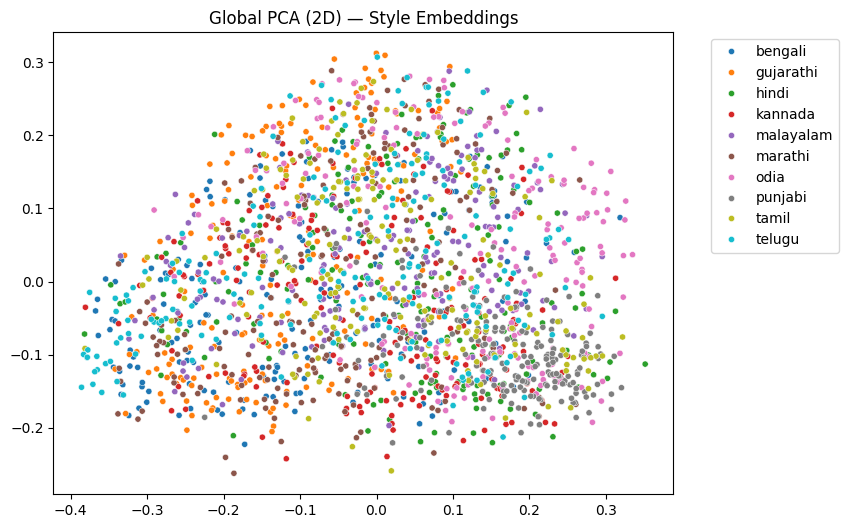

In [ ]:
pca2 = PCA(n_components=2)
s_2d = pca2.fit_transform(s)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=s_2d[:,0],
    y=s_2d[:,1],
    hue=language,
    palette="tab10",
    s=20
)
plt.title("Global PCA (2D) — Style Embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


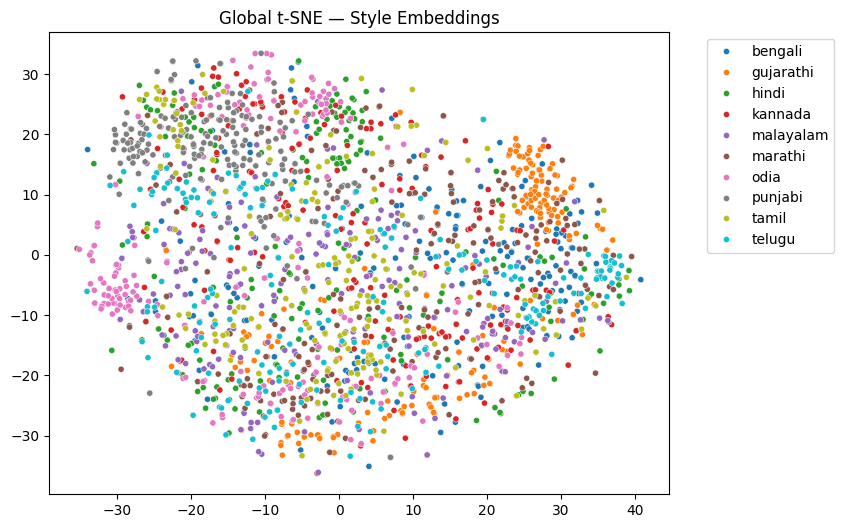

In [ ]:
pca = PCA(n_components=best_dim)
reduced = pca.fit_transform(s)

tsne = TSNE(
    n_components=2,
    perplexity=40,
    learning_rate=200,
    init="pca",
    random_state=42
)

tsne_2d = tsne.fit_transform(reduced)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=tsne_2d[:,0],
    y=tsne_2d[:,1],
    hue=language,
    palette="tab10",
    s=20
)
plt.title("Global t-SNE — Style Embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


  0%|          | 0/45 [00:00<?, ?it/s]

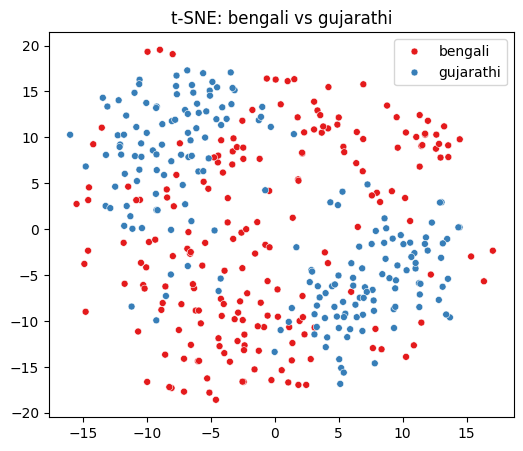

  2%|▏         | 1/45 [00:02<02:10,  2.97s/it]

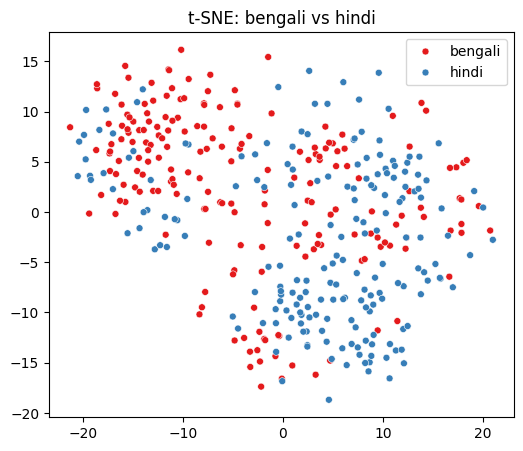

  4%|▍         | 2/45 [00:06<02:11,  3.07s/it]

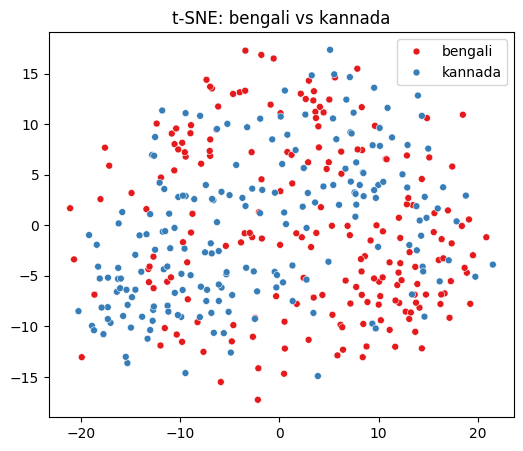

  7%|▋         | 3/45 [00:10<02:33,  3.66s/it]

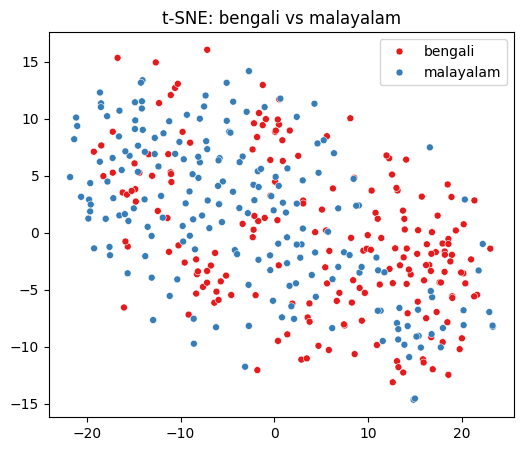

  9%|▉         | 4/45 [00:13<02:22,  3.47s/it]

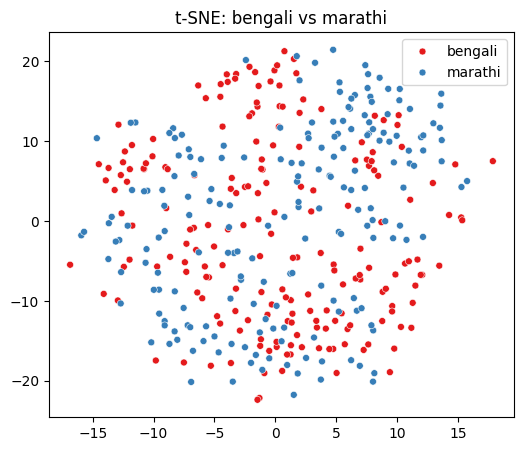

 11%|█         | 5/45 [00:16<02:12,  3.32s/it]

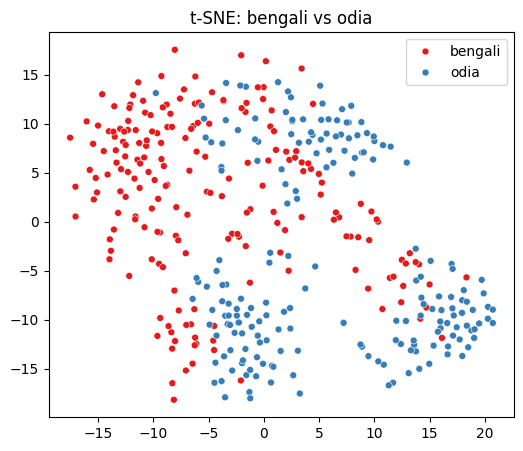

 13%|█▎        | 6/45 [00:19<02:04,  3.18s/it]

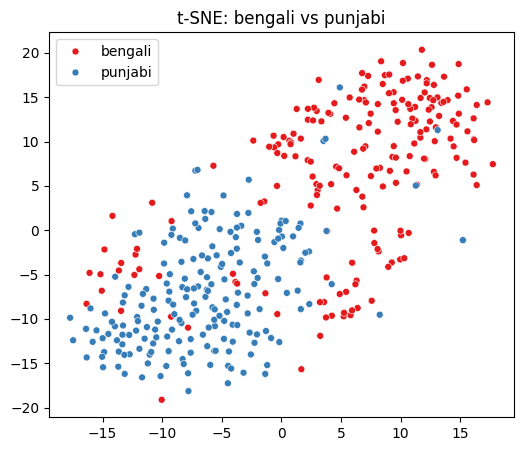

 16%|█▌        | 7/45 [00:24<02:16,  3.58s/it]

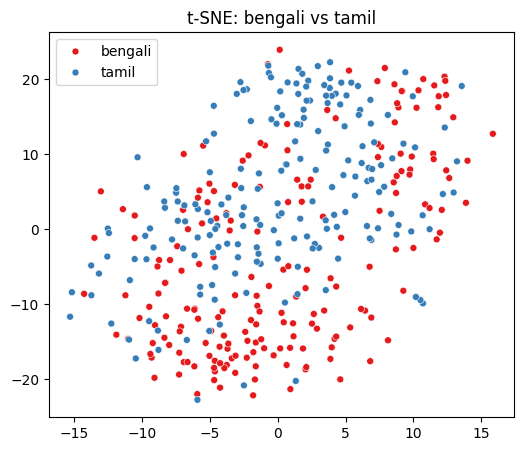

 18%|█▊        | 8/45 [00:27<02:07,  3.45s/it]

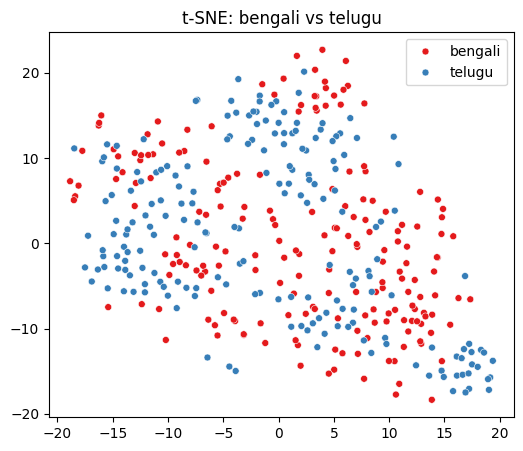

 20%|██        | 9/45 [00:30<01:58,  3.30s/it]

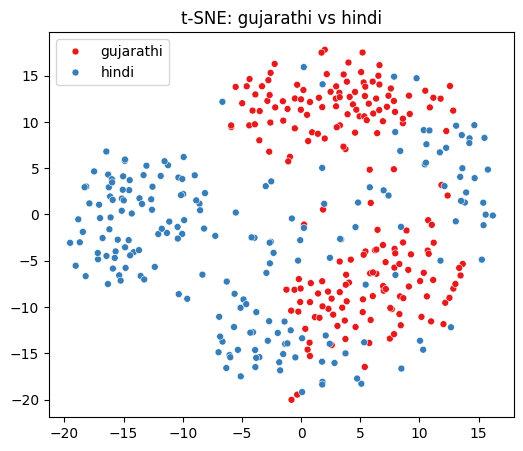

 22%|██▏       | 10/45 [00:33<01:50,  3.16s/it]

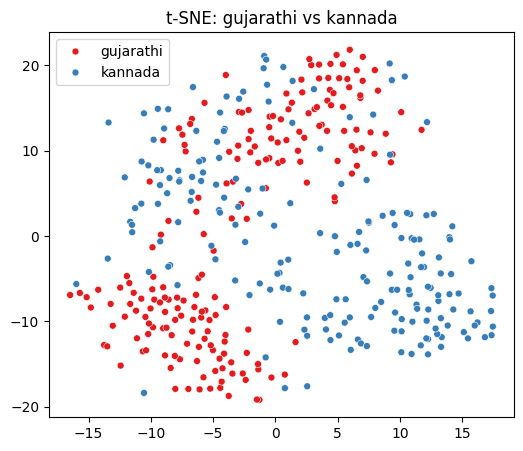

 24%|██▍       | 11/45 [00:37<01:56,  3.43s/it]

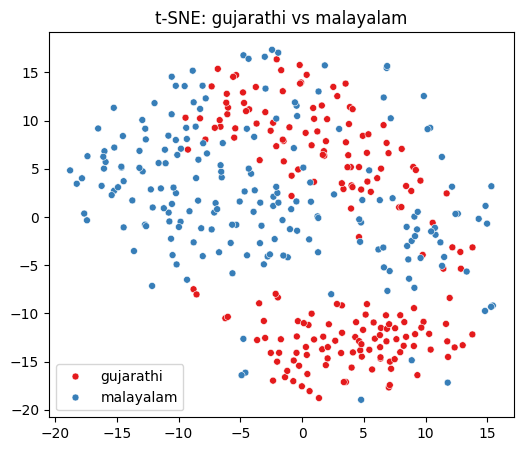

 27%|██▋       | 12/45 [00:40<01:52,  3.41s/it]

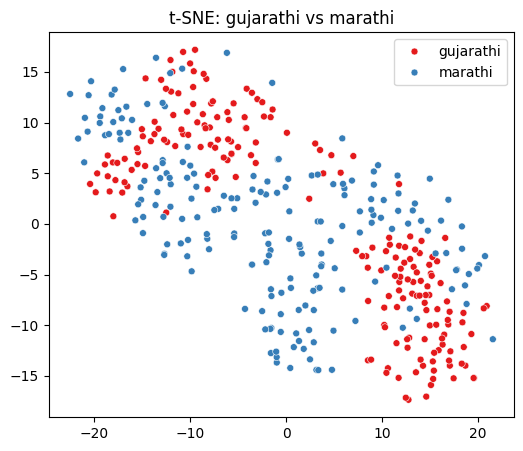

 29%|██▉       | 13/45 [00:43<01:44,  3.27s/it]

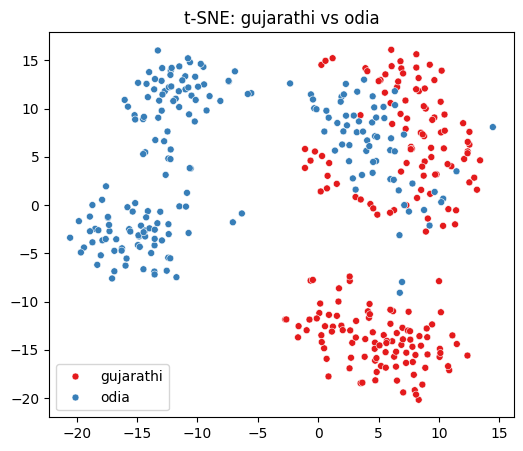

 31%|███       | 14/45 [00:46<01:36,  3.12s/it]

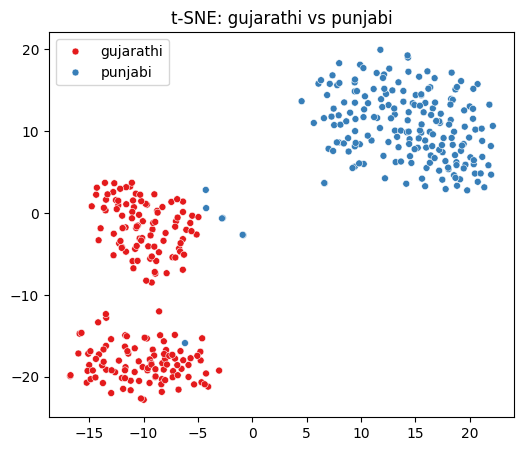

 33%|███▎      | 15/45 [00:49<01:33,  3.10s/it]

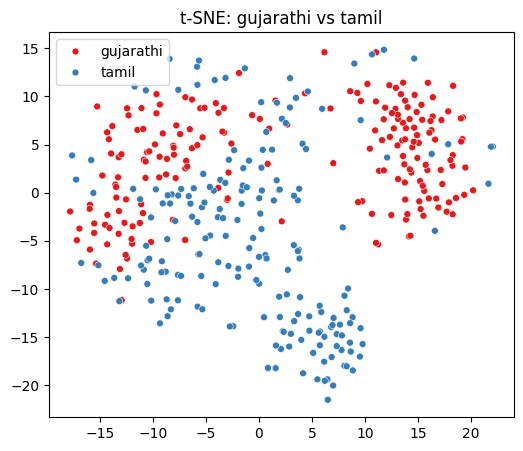

 36%|███▌      | 16/45 [00:53<01:39,  3.42s/it]

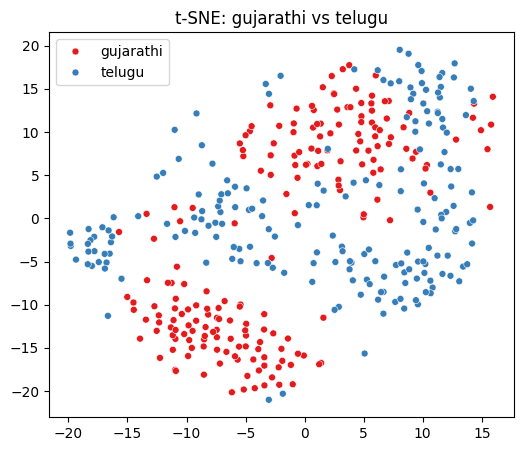

 38%|███▊      | 17/45 [00:56<01:31,  3.27s/it]

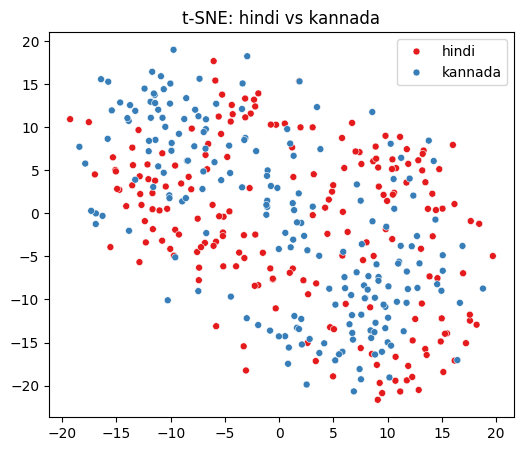

 40%|████      | 18/45 [00:59<01:26,  3.20s/it]

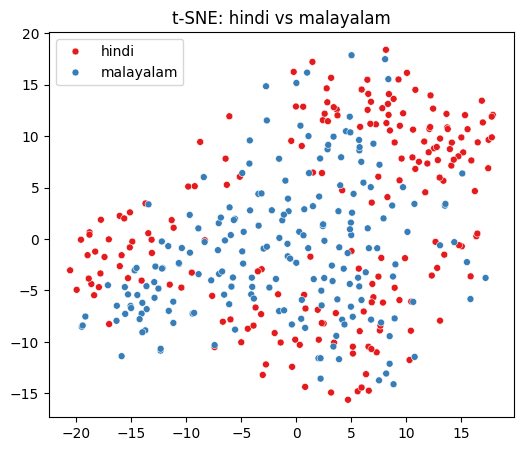

 42%|████▏     | 19/45 [01:02<01:21,  3.15s/it]

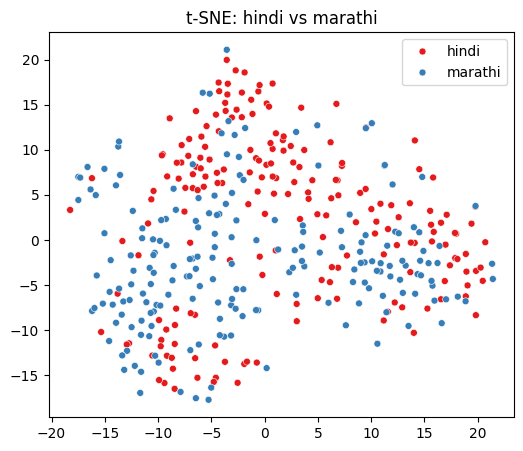

 44%|████▍     | 20/45 [01:06<01:29,  3.56s/it]

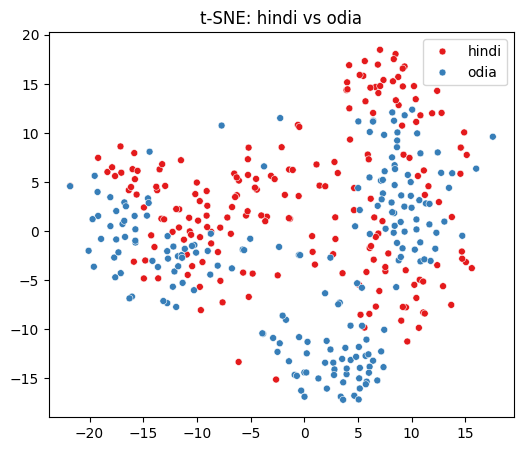

 47%|████▋     | 21/45 [01:09<01:21,  3.40s/it]

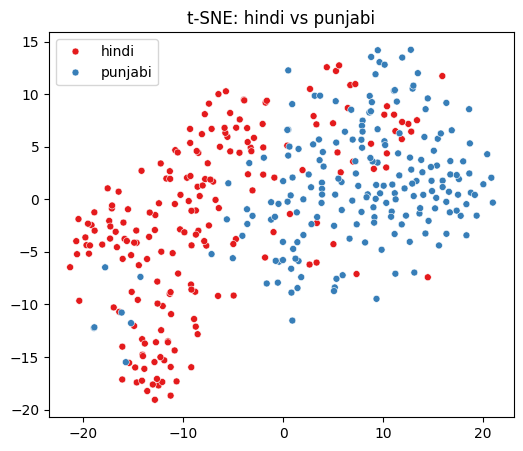

 49%|████▉     | 22/45 [01:13<01:16,  3.32s/it]

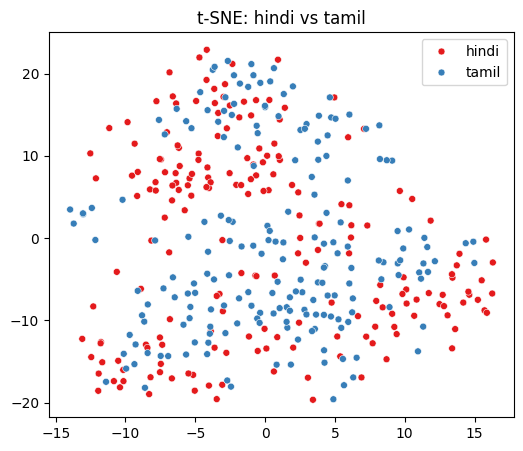

 51%|█████     | 23/45 [01:16<01:11,  3.25s/it]

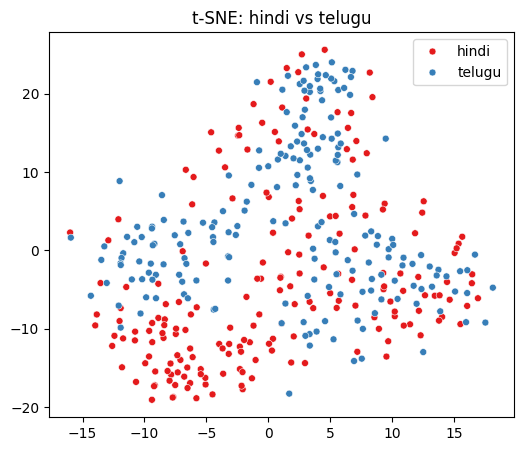

 53%|█████▎    | 24/45 [01:20<01:15,  3.61s/it]

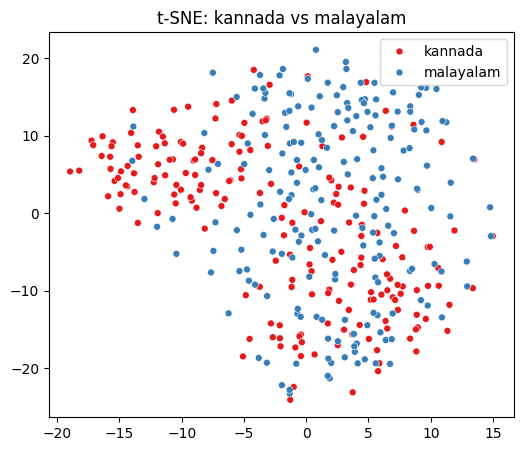

 56%|█████▌    | 25/45 [01:23<01:09,  3.48s/it]

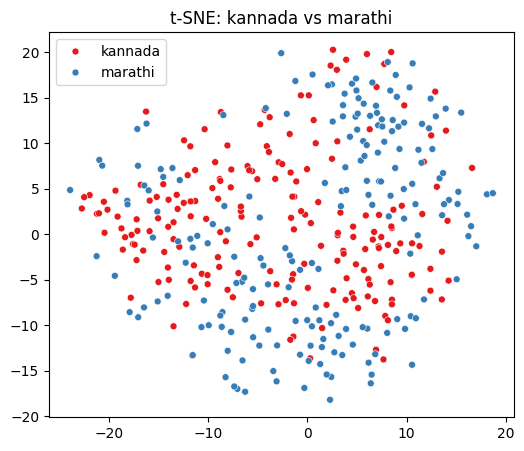

 58%|█████▊    | 26/45 [01:26<01:04,  3.38s/it]

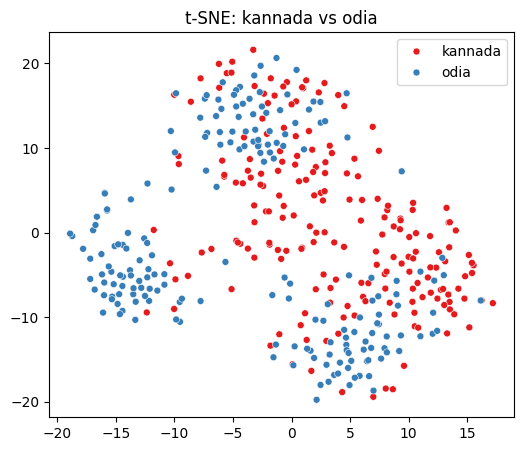

 60%|██████    | 27/45 [01:30<00:59,  3.30s/it]

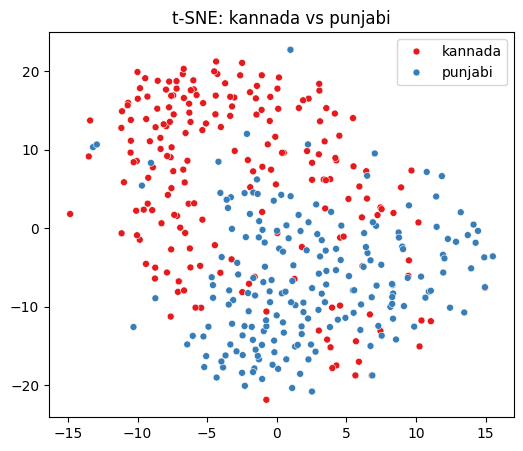

 62%|██████▏   | 28/45 [01:34<01:02,  3.65s/it]

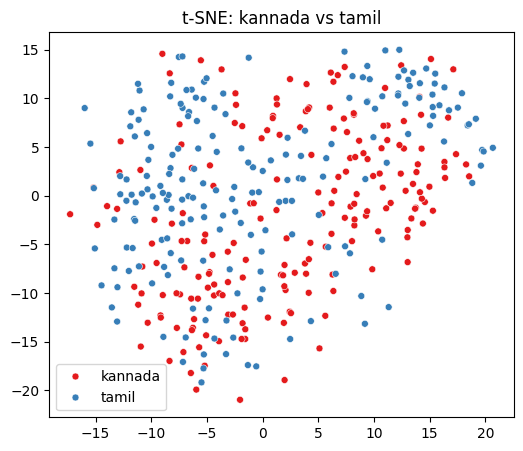

 64%|██████▍   | 29/45 [01:37<00:56,  3.53s/it]

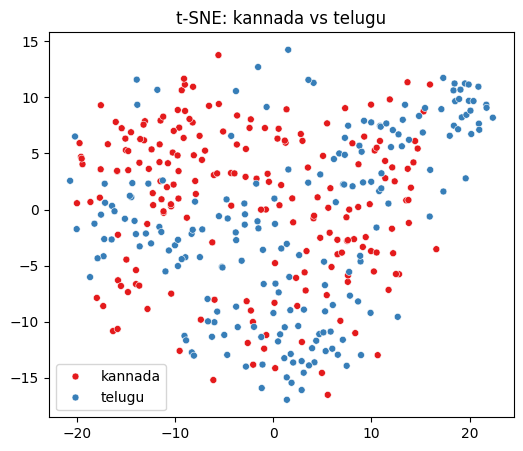

 67%|██████▋   | 30/45 [01:40<00:51,  3.40s/it]

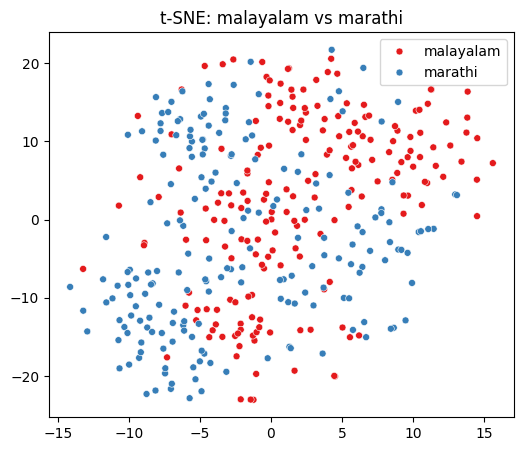

 69%|██████▉   | 31/45 [01:44<00:47,  3.36s/it]

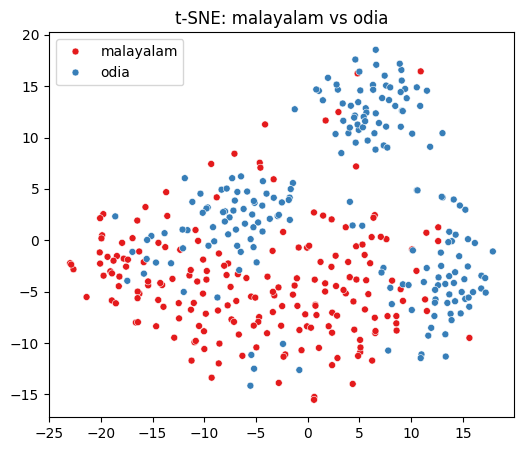

 71%|███████   | 32/45 [01:48<00:47,  3.64s/it]

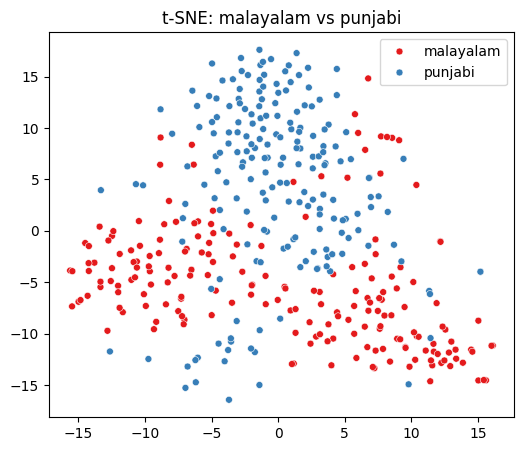

 73%|███████▎  | 33/45 [01:51<00:43,  3.60s/it]

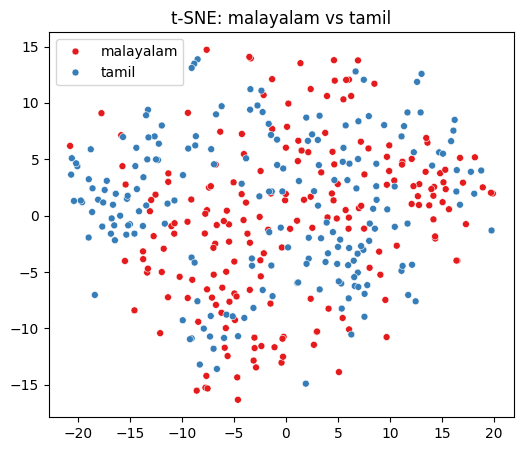

 76%|███████▌  | 34/45 [01:55<00:38,  3.47s/it]

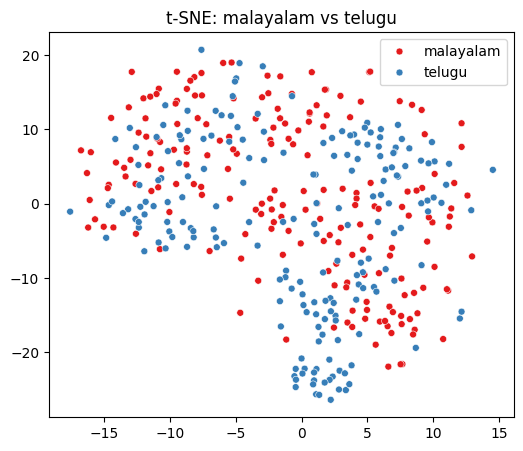

 78%|███████▊  | 35/45 [01:58<00:33,  3.37s/it]

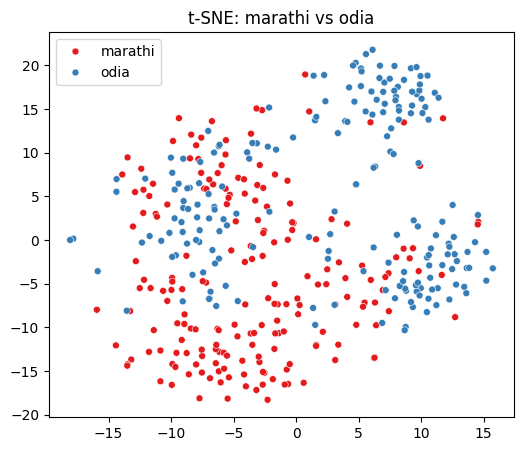

 80%|████████  | 36/45 [02:02<00:32,  3.63s/it]

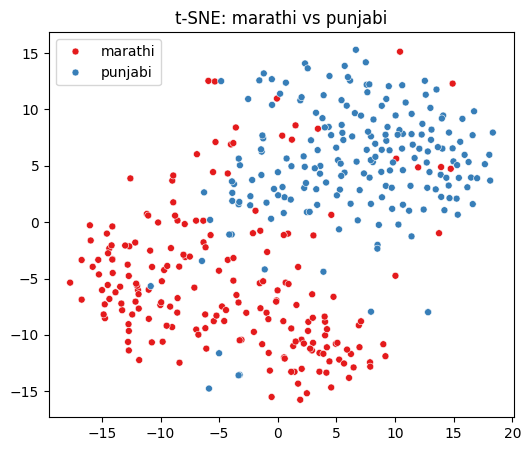

 82%|████████▏ | 37/45 [02:05<00:28,  3.60s/it]

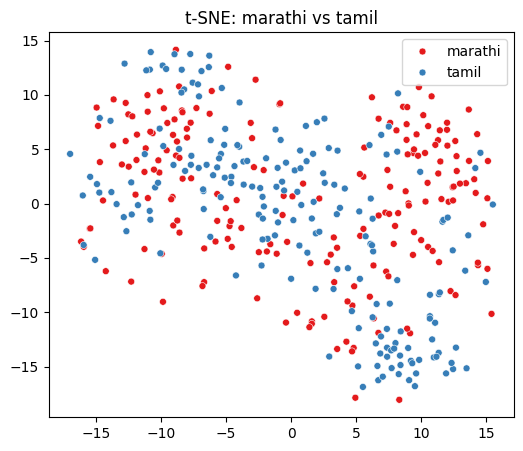

 84%|████████▍ | 38/45 [02:08<00:23,  3.42s/it]

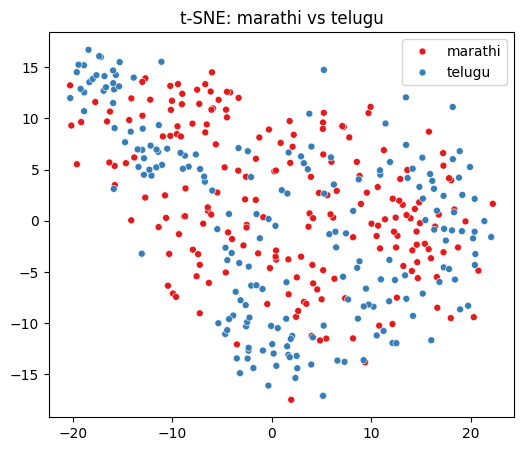

 87%|████████▋ | 39/45 [02:12<00:19,  3.31s/it]

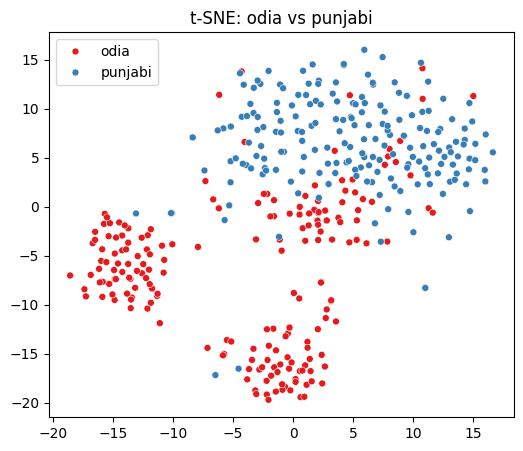

 89%|████████▉ | 40/45 [02:15<00:17,  3.42s/it]

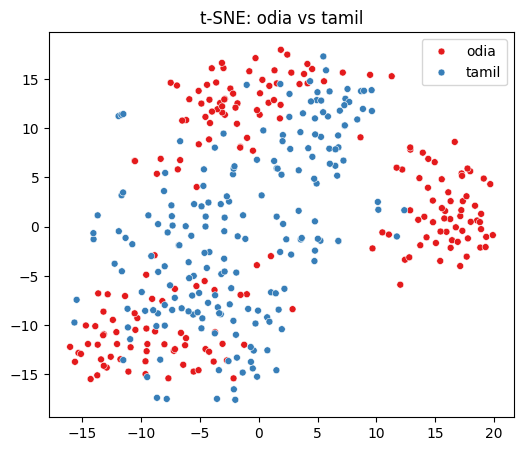

 91%|█████████ | 41/45 [02:19<00:13,  3.50s/it]

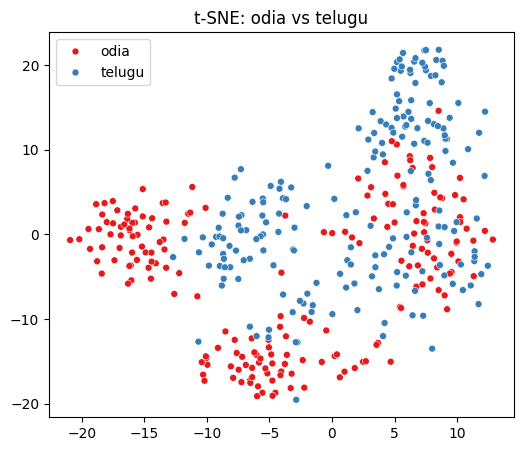

 93%|█████████▎| 42/45 [02:22<00:10,  3.37s/it]

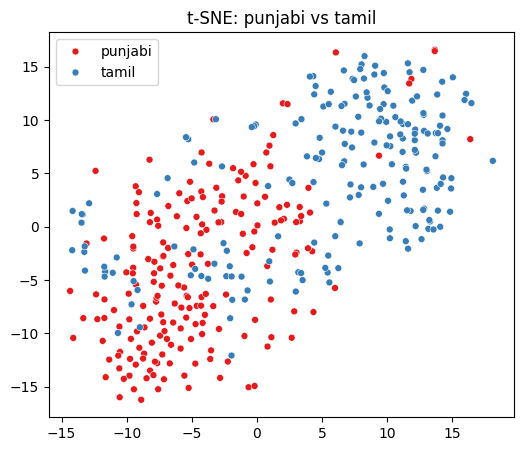

 96%|█████████▌| 43/45 [02:25<00:06,  3.25s/it]

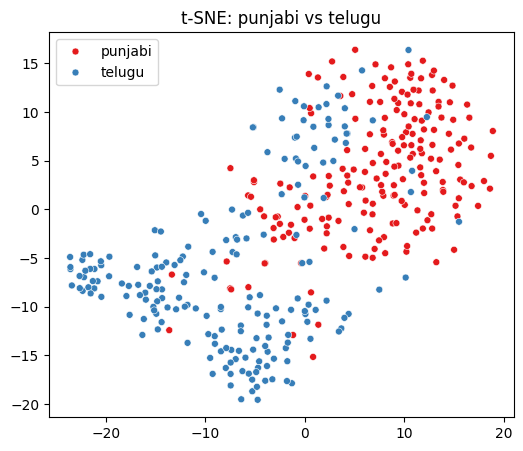

 98%|█████████▊| 44/45 [02:28<00:03,  3.26s/it]

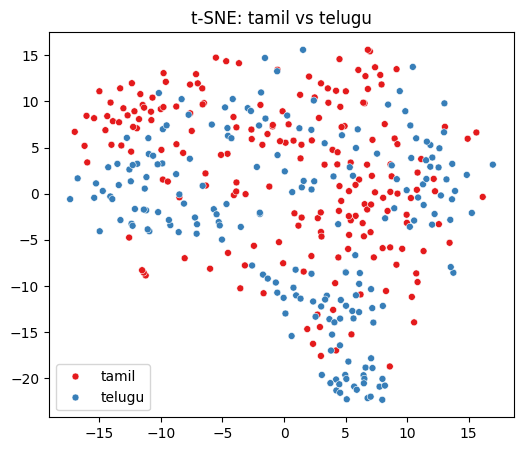

100%|██████████| 45/45 [02:32<00:00,  3.40s/it]


In [ ]:
langs = np.unique(language)
pairs = list(combinations(langs, 2))

for l1, l2 in tqdm(pairs):

    idx = np.where((language == l1) | (language == l2))[0]
    sub_s = s[idx]
    sub_lang = language[idx]

    pca = PCA(n_components=best_dim)
    reduced = pca.fit_transform(sub_s)

    tsne = TSNE(
        n_components=2,
        perplexity=30,
        learning_rate=200,
        init="pca",
        random_state=42
    )

    tsne_2d = tsne.fit_transform(reduced)

    plt.figure(figsize=(6,5))
    sns.scatterplot(
        x=tsne_2d[:,0],
        y=tsne_2d[:,1],
        hue=sub_lang,
        palette="Set1",
        s=25
    )
    plt.title(f"t-SNE: {l1} vs {l2}")
    plt.legend()
    plt.show()


In [ ]:
pair_scores = {}

for l1, l2 in pairs:
    idx = np.where((language == l1) | (language == l2))[0]
    sub_s = s[idx]
    sub_labels = LabelEncoder().fit_transform(language[idx])

    pca = PCA(n_components=best_dim)
    reduced = pca.fit_transform(sub_s)

    score = silhouette_score(reduced, sub_labels)
    pair_scores[(l1,l2)] = score

# Sort best separating accent pairs
sorted_pairs = sorted(pair_scores.items(), key=lambda x: x[1], reverse=True)

print("Top 5 best separated accent pairs:")
for pair, score in sorted_pairs[:5]:
    print(pair, "→", score)


Top 5 best separated accent pairs:
(np.str_('gujarathi'), np.str_('punjabi')) → 0.14968179
(np.str_('bengali'), np.str_('punjabi')) → 0.09481477
(np.str_('punjabi'), np.str_('telugu')) → 0.07871799
(np.str_('marathi'), np.str_('punjabi')) → 0.0772914
(np.str_('gujarathi'), np.str_('odia')) → 0.07593513


# wav2vec2

In [ ]:
!pip install transformers torchaudio librosa scikit-learn seaborn tqdm

import os
import torch
import librosa
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from collections import Counter
from itertools import combinations

from transformers import Wav2Vec2Model, Wav2Vec2Processor
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model_name = "facebook/wav2vec2-base"

processor = Wav2Vec2Processor.from_pretrained(model_name)
wav2vec = Wav2Vec2Model.from_pretrained(model_name)

wav2vec.to(device)
wav2vec.eval()

print("wav2vec2 loaded.")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/380M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/380M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/211 [00:00<?, ?it/s]

Wav2Vec2Model LOAD REPORT from: facebook/wav2vec2-base
Key                          | Status     |  | 
-----------------------------+------------+--+-
quantizer.codevectors        | UNEXPECTED |  | 
quantizer.weight_proj.weight | UNEXPECTED |  | 
quantizer.weight_proj.bias   | UNEXPECTED |  | 
project_hid.weight           | UNEXPECTED |  | 
project_hid.bias             | UNEXPECTED |  | 
project_q.weight             | UNEXPECTED |  | 
project_q.bias               | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


wav2vec2 loaded.


In [ ]:
ROOT = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/IndicTIMIT"

languages = sorted([
    d for d in os.listdir(ROOT)
    if os.path.isdir(os.path.join(ROOT, d))
])

print("Languages:", languages)


Languages: ['bengali', 'gujarathi', 'hindi', 'kannada', 'malayalam', 'marathi', 'odia', 'punjabi', 'tamil', 'telugu']


In [ ]:
@torch.no_grad()
def extract_w2v_embedding(path):

    # Load at 16k (wav2vec2 expects 16k)
    wav, sr = librosa.load(path, sr=16000)

    inputs = processor(
        wav,
        sampling_rate=16000,
        return_tensors="pt",
        padding=True
    )

    input_values = inputs.input_values.to(device)

    outputs = wav2vec(input_values)
    hidden = outputs.last_hidden_state  # (1, T, 768)

    # Mean pooling over time
    emb = hidden.mean(dim=1).squeeze(0)  # (768,)

    return emb.cpu().numpy()


w2v_embeddings = []

for path in tqdm(wav_paths):
    emb = extract_w2v_embedding(path)
    w2v_embeddings.append(emb)

w2v_embeddings = np.stack(w2v_embeddings)

print("wav2vec embeddings shape:", w2v_embeddings.shape)


100%|██████████| 1950/1950 [46:27<00:00,  1.43s/it]

wav2vec embeddings shape: (1950, 768)


In [ ]:
# Finite check
mask = np.isfinite(w2v_embeddings).all(axis=1)
w2v_embeddings = w2v_embeddings[mask]
wav_langs = np.array(wav_langs)[mask]

# Clip
w2v_embeddings = np.clip(w2v_embeddings, -10, 10)

# L2 normalize
norms = np.linalg.norm(w2v_embeddings, axis=1, keepdims=True)
w2v_embeddings = w2v_embeddings / (norms + 1e-8)

print("After cleaning:", w2v_embeddings.shape)


After cleaning: (1950, 768)


In [ ]:
le = LabelEncoder()
labels = le.fit_transform(wav_langs)

pca_100 = PCA(n_components=100)
w2v_100 = pca_100.fit_transform(w2v_embeddings)

sil_score = silhouette_score(w2v_100, labels)

print("Global Silhouette Score (wav2vec2, 100D PCA):", sil_score)


Global Silhouette Score (wav2vec2, 100D PCA): -0.033600733


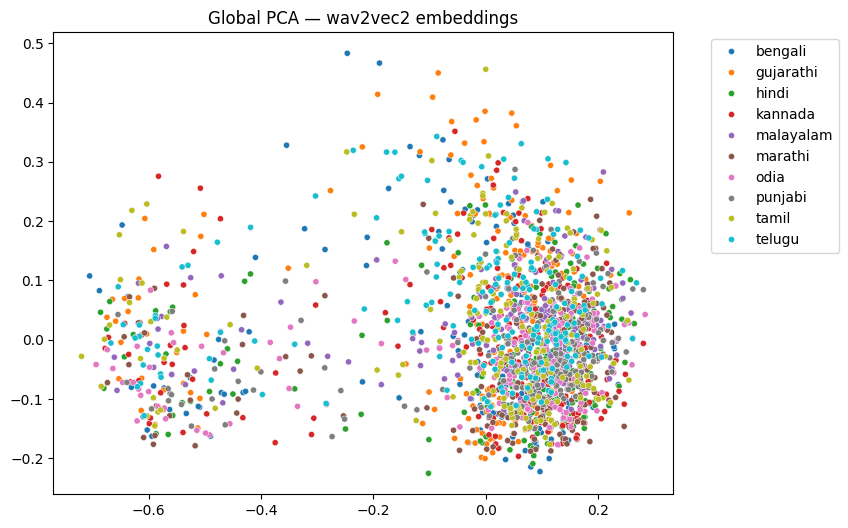

In [ ]:
pca2 = PCA(n_components=2)
w2v_2d = pca2.fit_transform(w2v_embeddings)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=w2v_2d[:,0],
    y=w2v_2d[:,1],
    hue=wav_langs,
    palette="tab10",
    s=20
)
plt.title("Global PCA — wav2vec2 embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


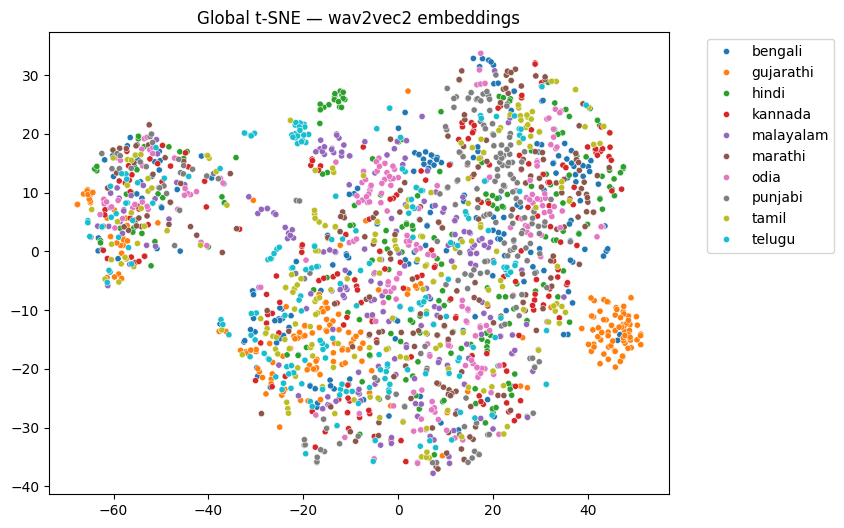

In [ ]:
tsne = TSNE(
    n_components=2,
    perplexity=40,
    learning_rate=200,
    init="pca",
    random_state=42
)

w2v_tsne = tsne.fit_transform(w2v_100)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=w2v_tsne[:,0],
    y=w2v_tsne[:,1],
    hue=wav_langs,
    palette="tab10",
    s=20
)
plt.title("Global t-SNE — wav2vec2 embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


Pairwise

In [ ]:
from itertools import combinations
from sklearn.preprocessing import LabelEncoder

langs = np.unique(wav_langs)
pairs = list(combinations(langs, 2))

print("Total language pairs:", len(pairs))  # should be 45


Total language pairs: 45


In [ ]:
pair_silhouette = {}

for l1, l2 in pairs:

    idx = np.where((wav_langs == l1) | (wav_langs == l2))[0]

    sub_emb = w2v_100[idx]          # 100D PCA embeddings
    sub_lang = wav_langs[idx]

    sub_labels = LabelEncoder().fit_transform(sub_lang)

    score = silhouette_score(sub_emb, sub_labels)
    pair_silhouette[(l1, l2)] = score

# Sort from best separated to worst
sorted_pairs = sorted(pair_silhouette.items(), key=lambda x: x[1], reverse=True)

print("Top 5 most separated accent pairs (wav2vec2):")
for pair, score in sorted_pairs[:5]:
    print(pair, "→", round(score, 4))

print("\nBottom 5 least separated accent pairs:")
for pair, score in sorted_pairs[-5:]:
    print(pair, "→", round(score, 4))


Top 5 most separated accent pairs (wav2vec2):
(np.str_('gujarathi'), np.str_('punjabi')) → 0.0814
(np.str_('punjabi'), np.str_('telugu')) → 0.0492
(np.str_('gujarathi'), np.str_('marathi')) → 0.045
(np.str_('gujarathi'), np.str_('odia')) → 0.0439
(np.str_('gujarathi'), np.str_('hindi')) → 0.0407

Bottom 5 least separated accent pairs:
(np.str_('bengali'), np.str_('tamil')) → 0.0078
(np.str_('hindi'), np.str_('kannada')) → 0.0069
(np.str_('bengali'), np.str_('kannada')) → 0.006
(np.str_('kannada'), np.str_('tamil')) → 0.0055
(np.str_('hindi'), np.str_('marathi')) → 0.0035


  0%|          | 0/45 [00:00<?, ?it/s]

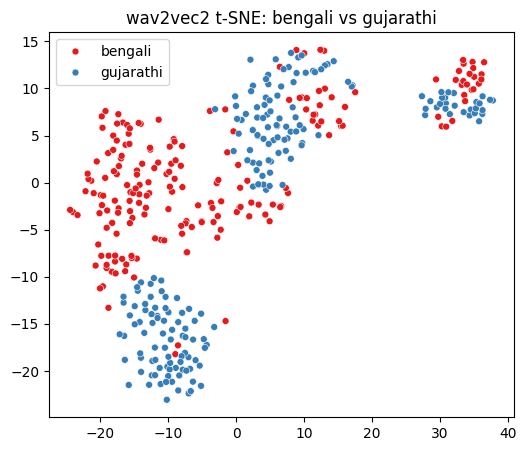

  2%|▏         | 1/45 [00:02<02:10,  2.97s/it]

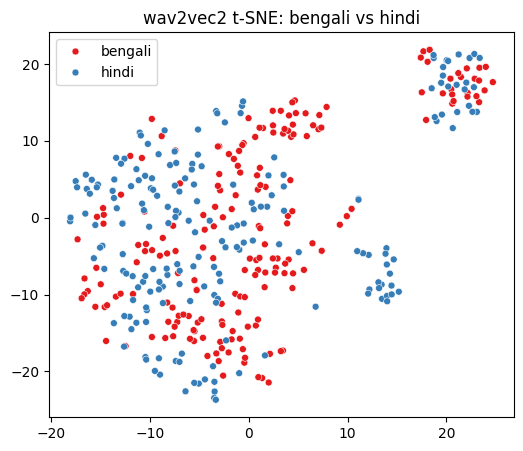

  4%|▍         | 2/45 [00:06<02:11,  3.06s/it]

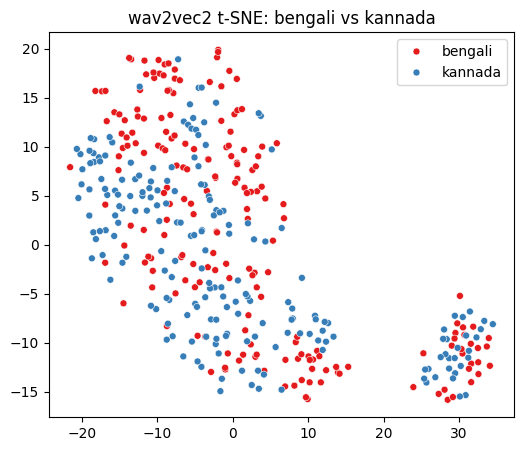

  7%|▋         | 3/45 [00:10<02:32,  3.62s/it]

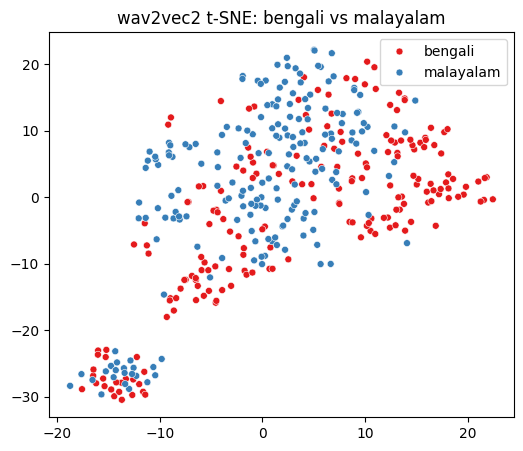

  9%|▉         | 4/45 [00:13<02:19,  3.39s/it]

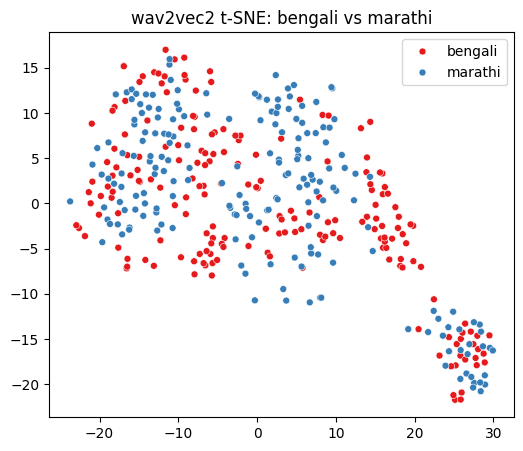

 11%|█         | 5/45 [00:16<02:09,  3.24s/it]

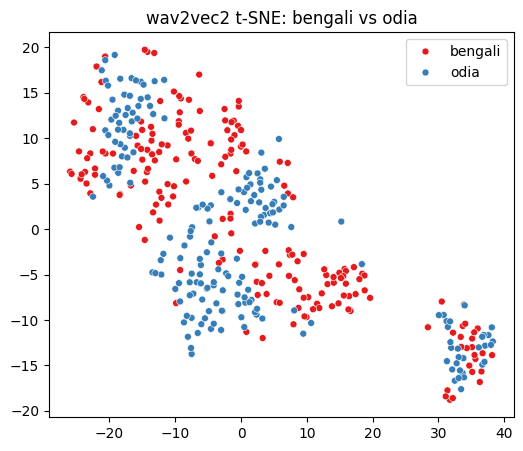

 13%|█▎        | 6/45 [00:19<02:05,  3.21s/it]

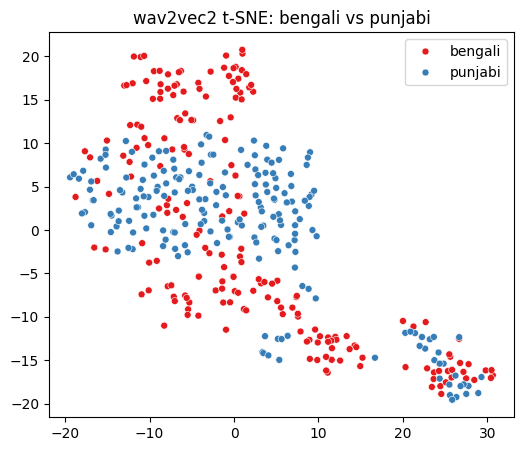

 16%|█▌        | 7/45 [00:23<02:17,  3.61s/it]

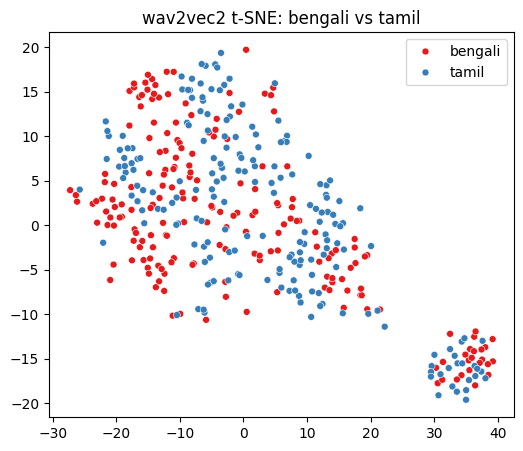

 18%|█▊        | 8/45 [00:27<02:07,  3.46s/it]

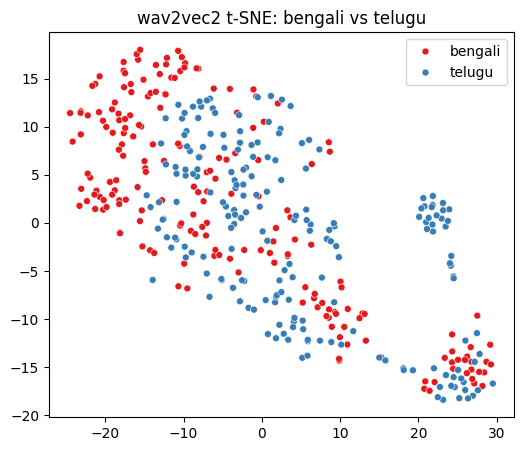

 20%|██        | 9/45 [00:30<02:00,  3.36s/it]

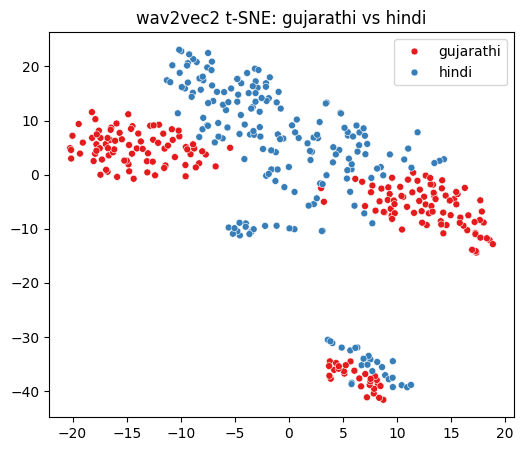

 22%|██▏       | 10/45 [00:33<01:54,  3.28s/it]

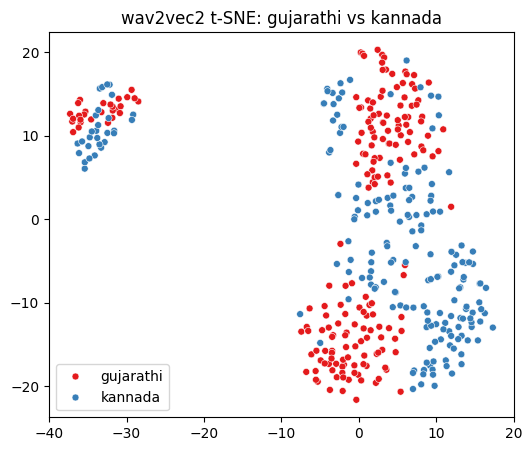

 24%|██▍       | 11/45 [00:37<02:02,  3.59s/it]

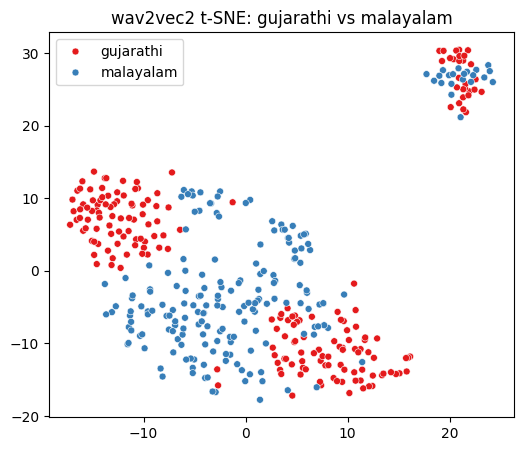

 27%|██▋       | 12/45 [00:40<01:51,  3.38s/it]

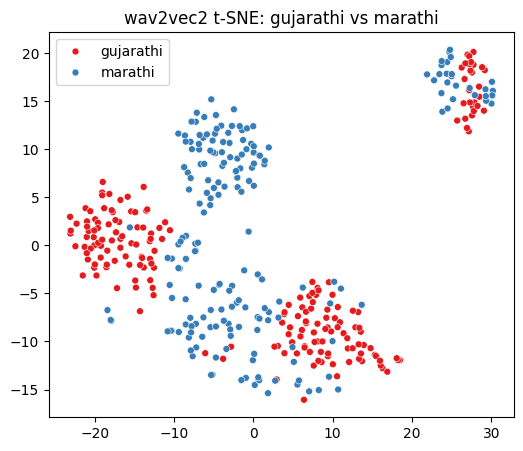

 29%|██▉       | 13/45 [00:43<01:43,  3.23s/it]

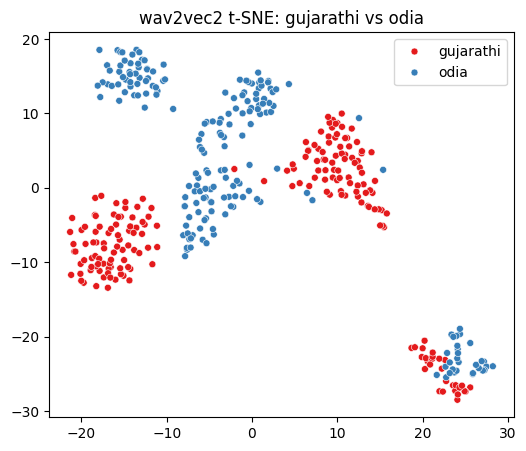

 31%|███       | 14/45 [00:46<01:35,  3.07s/it]

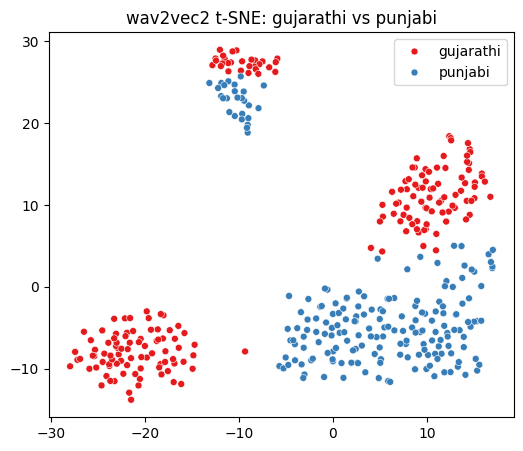

 33%|███▎      | 15/45 [00:49<01:35,  3.17s/it]

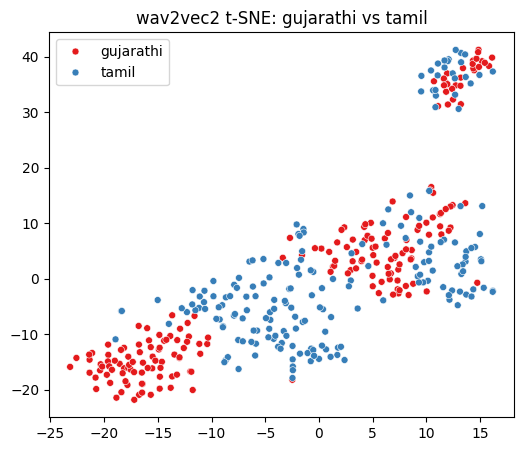

 36%|███▌      | 16/45 [00:53<01:37,  3.35s/it]

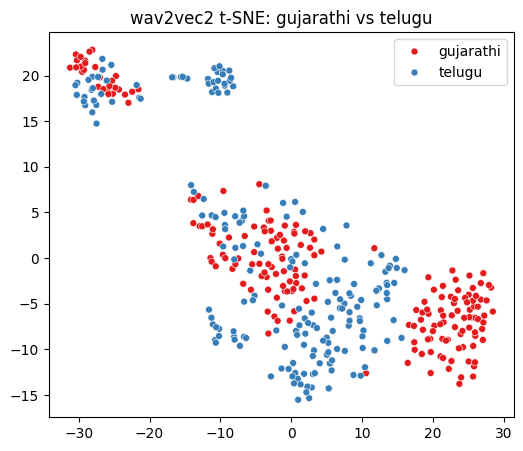

 38%|███▊      | 17/45 [00:56<01:30,  3.23s/it]

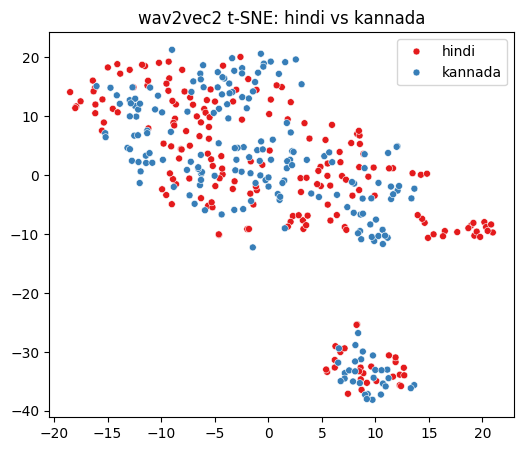

 40%|████      | 18/45 [00:59<01:26,  3.21s/it]

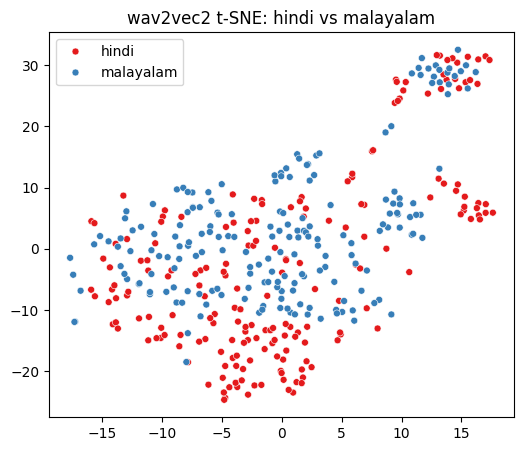

 42%|████▏     | 19/45 [01:03<01:31,  3.50s/it]

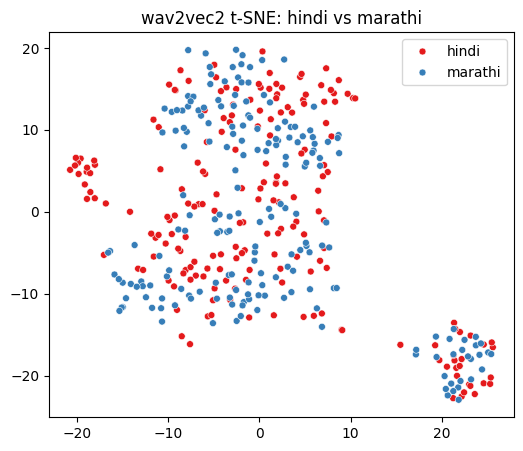

 44%|████▍     | 20/45 [01:07<01:29,  3.58s/it]

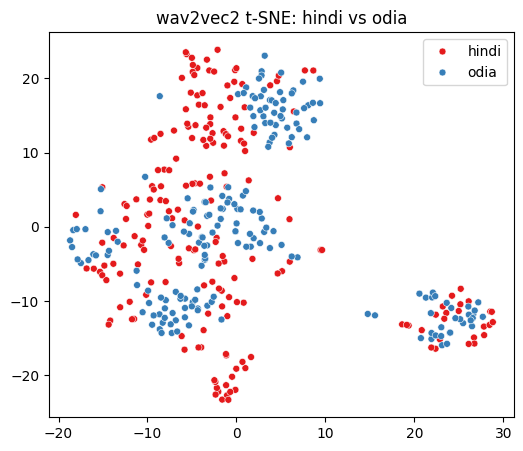

 47%|████▋     | 21/45 [01:10<01:20,  3.37s/it]

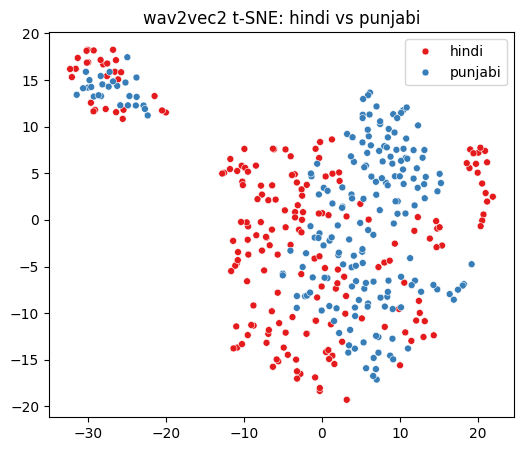

 49%|████▉     | 22/45 [01:13<01:16,  3.30s/it]

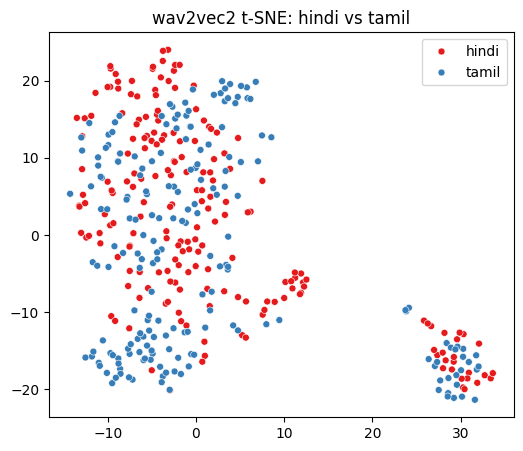

 51%|█████     | 23/45 [01:16<01:11,  3.25s/it]

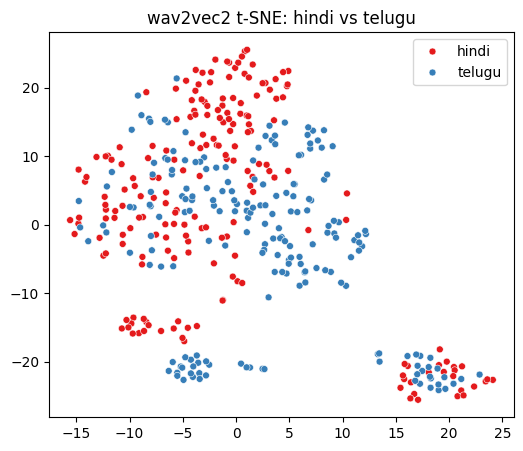

 53%|█████▎    | 24/45 [01:20<01:14,  3.56s/it]

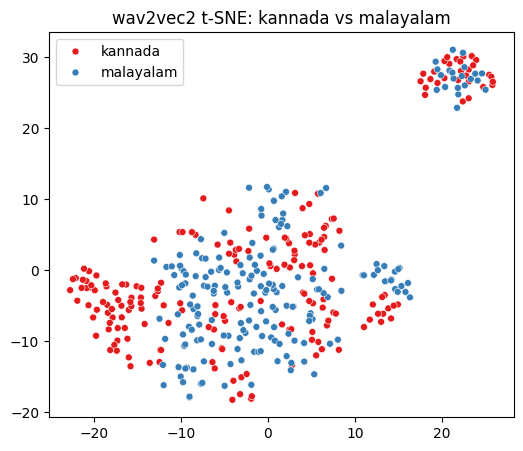

 56%|█████▌    | 25/45 [01:23<01:07,  3.37s/it]

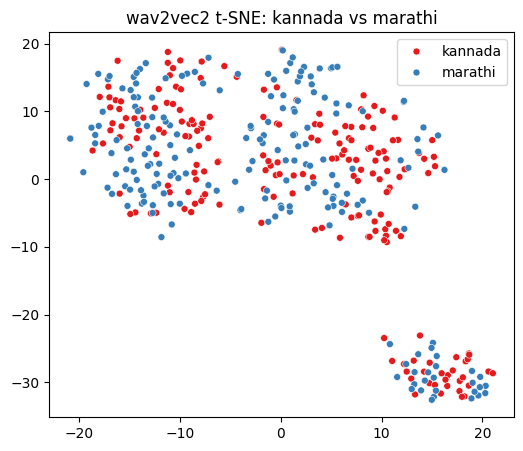

 58%|█████▊    | 26/45 [01:26<01:01,  3.24s/it]

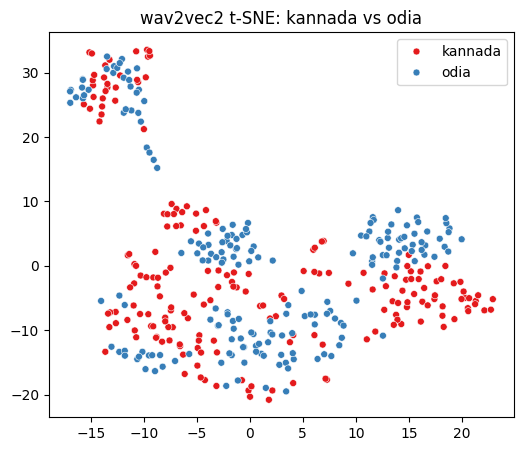

 60%|██████    | 27/45 [01:29<00:57,  3.18s/it]

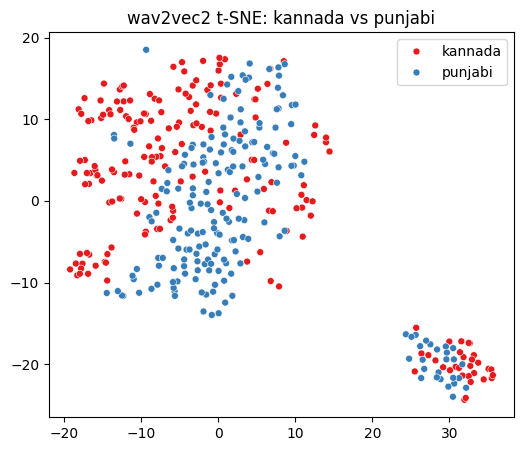

 62%|██████▏   | 28/45 [01:34<01:00,  3.58s/it]

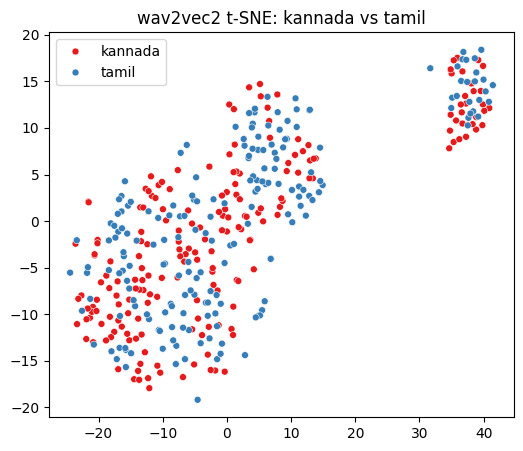

 64%|██████▍   | 29/45 [01:37<00:55,  3.44s/it]

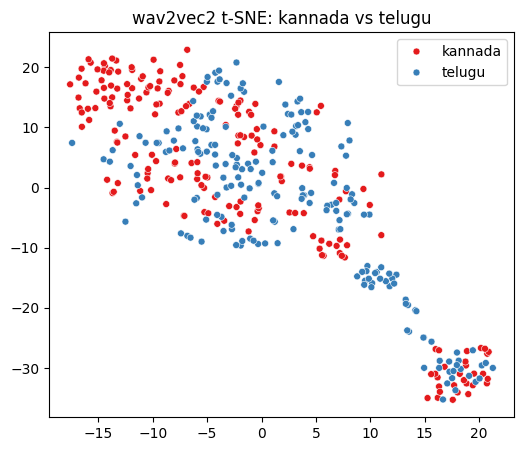

 67%|██████▋   | 30/45 [01:40<00:49,  3.33s/it]

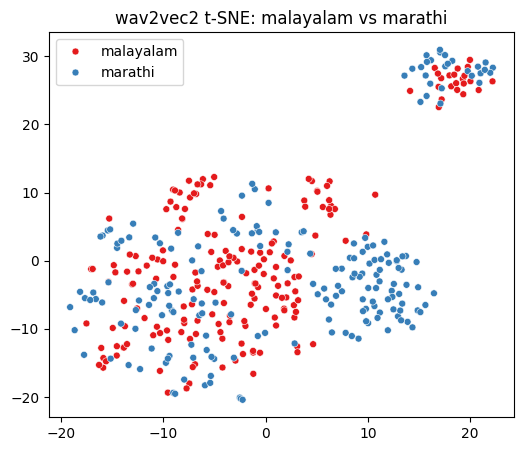

 69%|██████▉   | 31/45 [01:43<00:45,  3.23s/it]

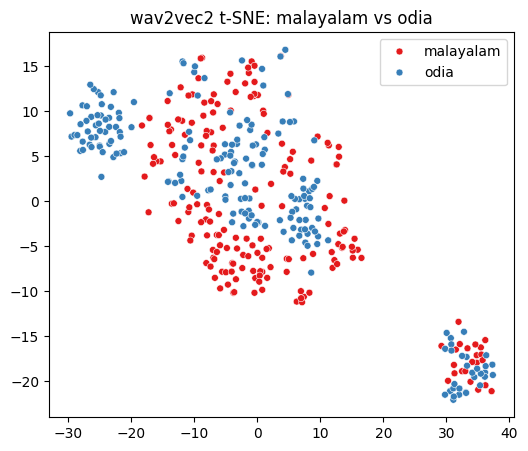

 71%|███████   | 32/45 [01:47<00:46,  3.58s/it]

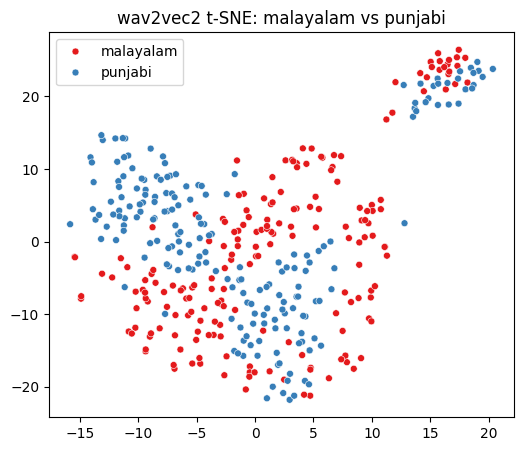

 73%|███████▎  | 33/45 [01:51<00:41,  3.49s/it]

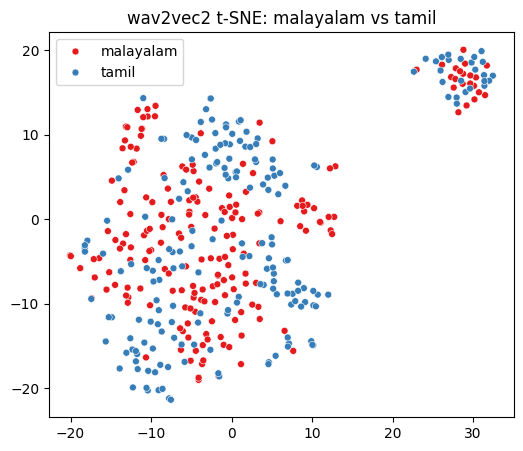

 76%|███████▌  | 34/45 [01:54<00:36,  3.33s/it]

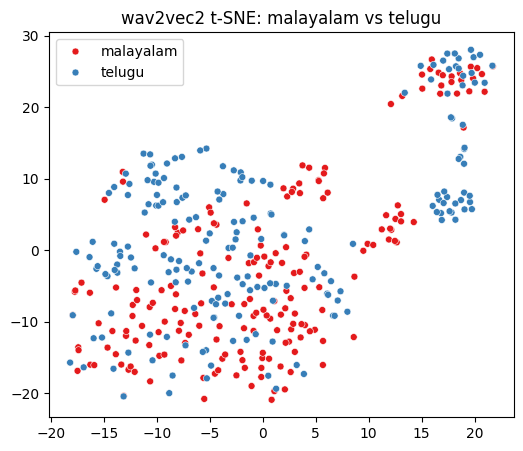

 78%|███████▊  | 35/45 [01:57<00:32,  3.25s/it]

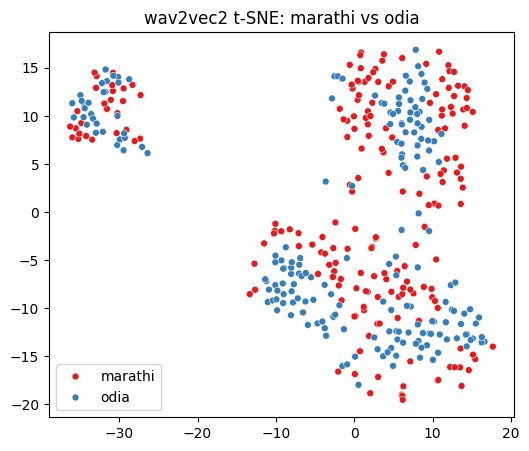

 80%|████████  | 36/45 [02:00<00:30,  3.42s/it]

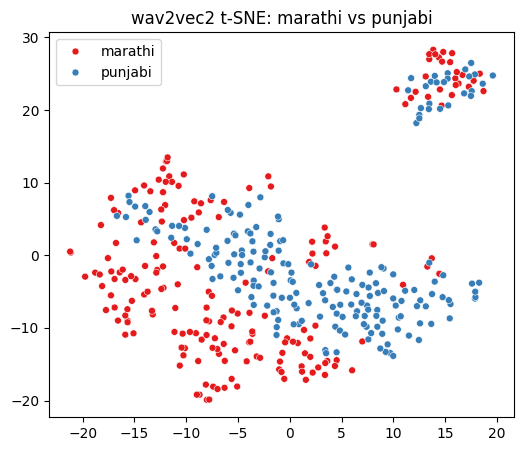

 82%|████████▏ | 37/45 [02:04<00:27,  3.48s/it]

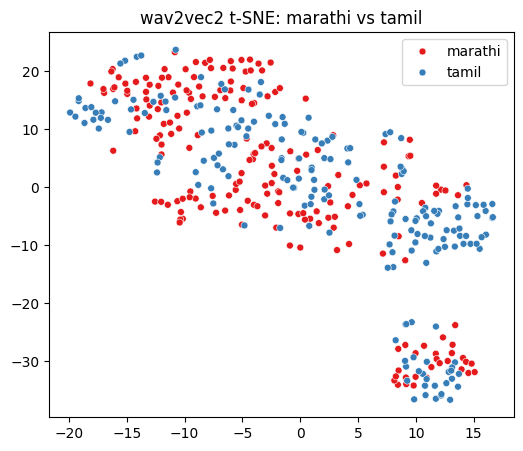

 84%|████████▍ | 38/45 [02:07<00:23,  3.38s/it]

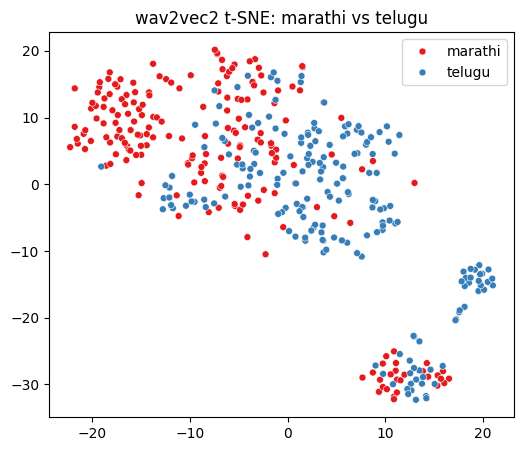

 87%|████████▋ | 39/45 [02:10<00:19,  3.26s/it]

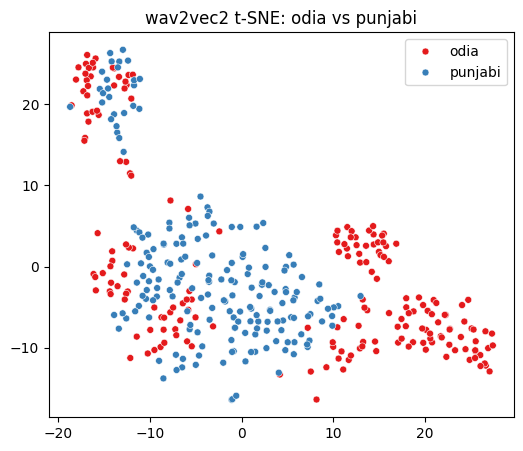

 89%|████████▉ | 40/45 [02:13<00:16,  3.27s/it]

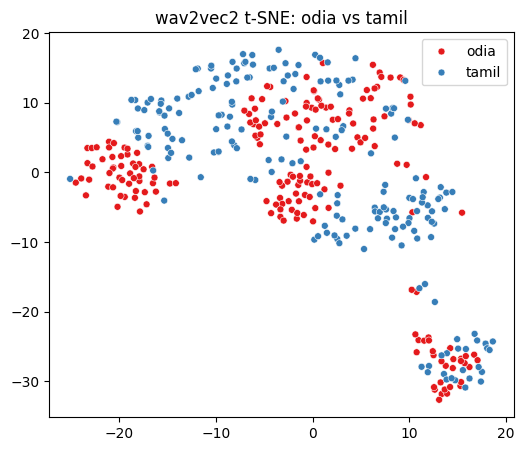

 91%|█████████ | 41/45 [02:17<00:13,  3.47s/it]

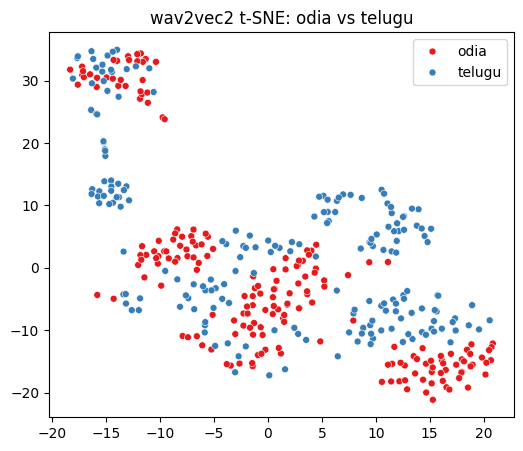

 93%|█████████▎| 42/45 [02:20<00:09,  3.32s/it]

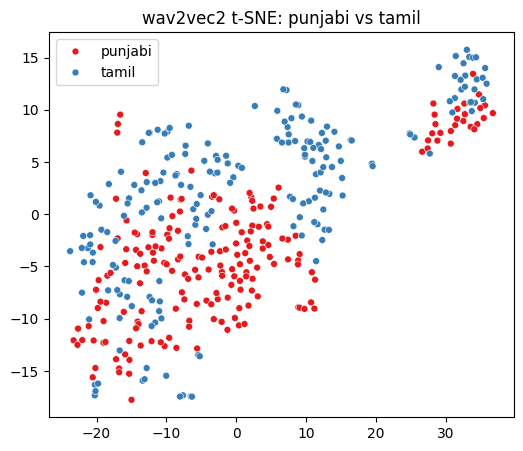

 96%|█████████▌| 43/45 [02:24<00:06,  3.30s/it]

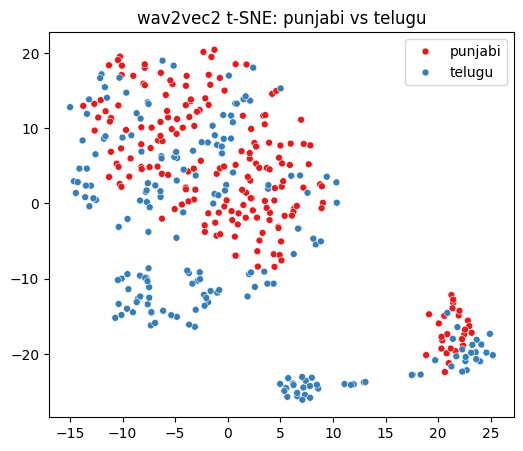

 98%|█████████▊| 44/45 [02:27<00:03,  3.28s/it]

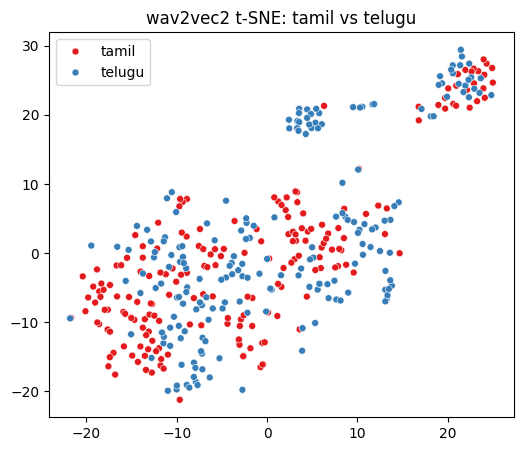

100%|██████████| 45/45 [02:31<00:00,  3.37s/it]


In [ ]:
from tqdm import tqdm
from sklearn.manifold import TSNE

for l1, l2 in tqdm(pairs):

    idx = np.where((wav_langs == l1) | (wav_langs == l2))[0]

    sub_emb = w2v_100[idx]
    sub_lang = wav_langs[idx]

    tsne = TSNE(
        n_components=2,
        perplexity=30,
        learning_rate=200,
        init="pca",
        random_state=42
    )

    tsne_2d = tsne.fit_transform(sub_emb)

    plt.figure(figsize=(6,5))
    sns.scatterplot(
        x=tsne_2d[:,0],
        y=tsne_2d[:,1],
        hue=sub_lang,
        palette="Set1",
        s=25
    )
    plt.title(f"wav2vec2 t-SNE: {l1} vs {l2}")
    plt.legend()
    plt.show()


# Indian finetuned model

In [ ]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import silhouette_score
from itertools import combinations
from tqdm import tqdm

In [ ]:
MAT_PATH = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/indic_style_full_ft.mat"
data = sio.loadmat(MAT_PATH)

print(data.keys())


dict_keys(['__header__', '__version__', '__globals__', 'filename', 'text', 'language', 'sa', 'sp', 's', 'htext', 'hbert'])


In [ ]:
MAT_PATH = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/indic_style_full_ft.mat"
data = sio.loadmat(MAT_PATH)

s = data["s"]                 # (1950, 256)
language = data["language"].squeeze()

# Flatten language array
language = np.array([str(x[0]) if isinstance(x, np.ndarray) else str(x)
                     for x in language])

print("Embedding shape:", s.shape)
print("Total samples:", len(language))


Embedding shape: (1950, 256)
Total samples: 1950


In [ ]:
# Remove non-finite
mask = np.isfinite(s).all(axis=1)
s = s[mask]
language = language[mask]

# Clip extreme values
s = np.clip(s, -10, 10)

# L2 normalize
norms = np.linalg.norm(s, axis=1, keepdims=True)
s = s / (norms + 1e-8)

print("After cleaning:", s.shape)


After cleaning: (1950, 256)


In [ ]:
dims = [10, 20, 50, 70, 100]

le = LabelEncoder()
labels = le.fit_transform(language)

results = {}

for d in dims:
    pca = PCA(n_components=d)
    reduced = pca.fit_transform(s)

    score = silhouette_score(reduced, labels)
    results[d] = score
    print(f"PCA {d}D → Silhouette Score: {score:.4f}")


PCA 10D → Silhouette Score: -0.0524
PCA 20D → Silhouette Score: -0.0391
PCA 50D → Silhouette Score: -0.0282
PCA 70D → Silhouette Score: -0.0262
PCA 100D → Silhouette Score: -0.0261


In [ ]:
best_dim = max(results, key=results.get)

print("Best PCA dimension:", best_dim)
print("Best silhouette score:", results[best_dim])


Best PCA dimension: 100
Best silhouette score: -0.026101261


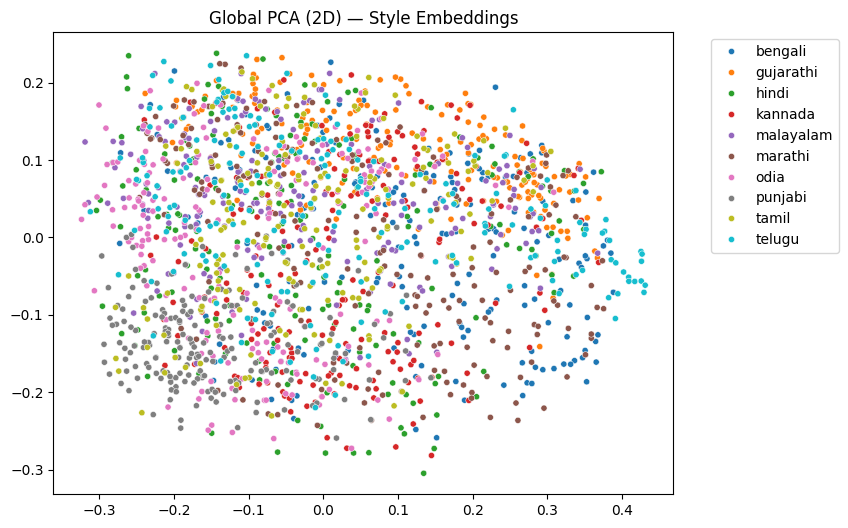

In [ ]:
pca2 = PCA(n_components=2)
s_2d = pca2.fit_transform(s)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=s_2d[:,0],
    y=s_2d[:,1],
    hue=language,
    palette="tab10",
    s=20
)
plt.title("Global PCA (2D) — Style Embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


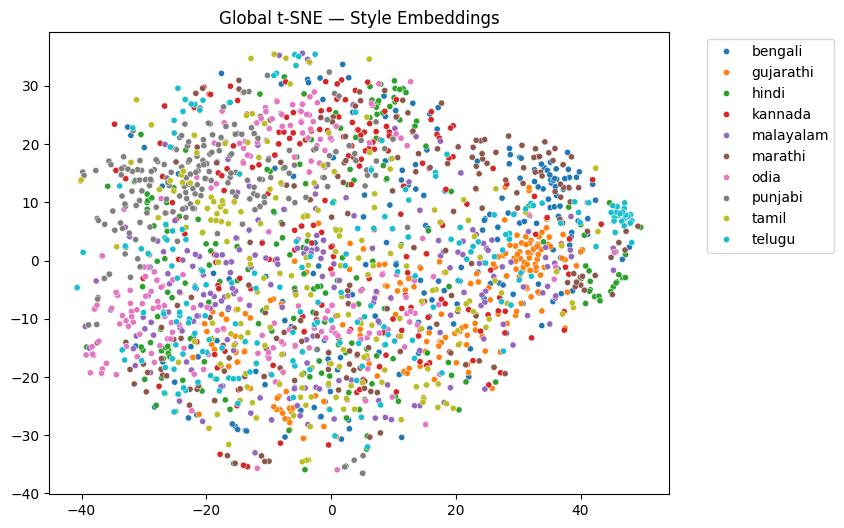

In [ ]:
pca = PCA(n_components=best_dim)
reduced = pca.fit_transform(s)

tsne = TSNE(
    n_components=2,
    perplexity=40,
    learning_rate=200,
    init="pca",
    random_state=42
)

tsne_2d = tsne.fit_transform(reduced)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=tsne_2d[:,0],
    y=tsne_2d[:,1],
    hue=language,
    palette="tab10",
    s=20
)
plt.title("Global t-SNE — Style Embeddings")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


  0%|          | 0/45 [00:00<?, ?it/s]

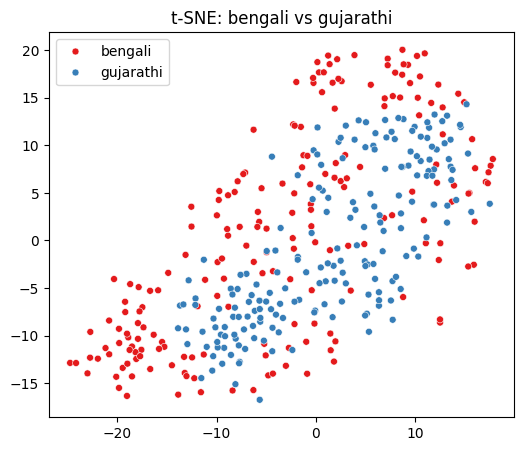

  2%|▏         | 1/45 [00:02<02:09,  2.93s/it]

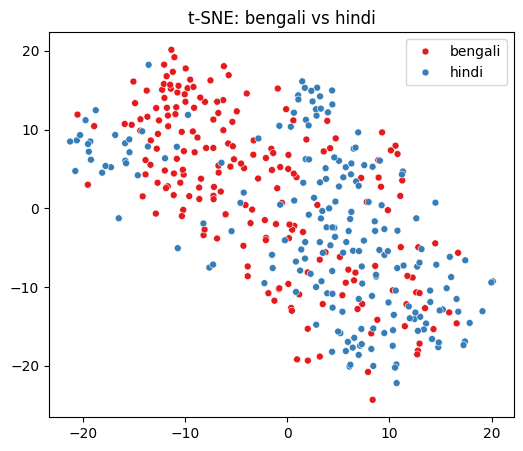

  4%|▍         | 2/45 [00:05<02:05,  2.91s/it]

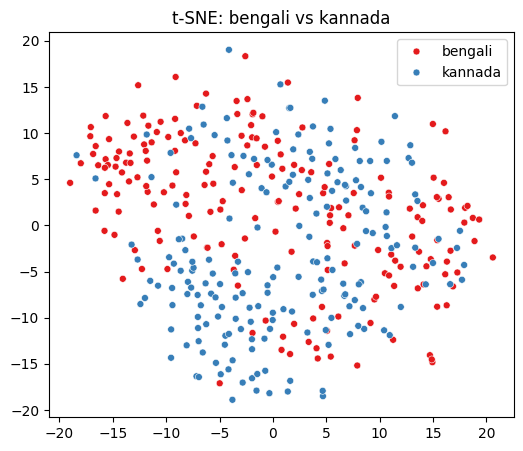

  7%|▋         | 3/45 [00:08<02:05,  2.98s/it]

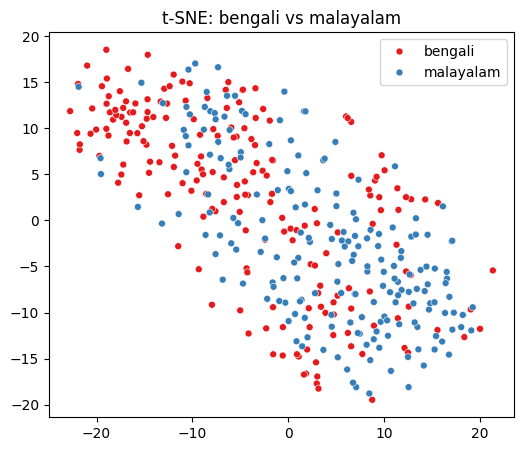

  9%|▉         | 4/45 [00:13<02:26,  3.58s/it]

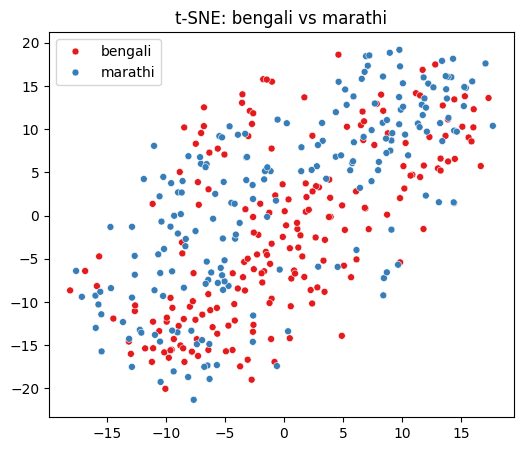

 11%|█         | 5/45 [00:16<02:17,  3.44s/it]

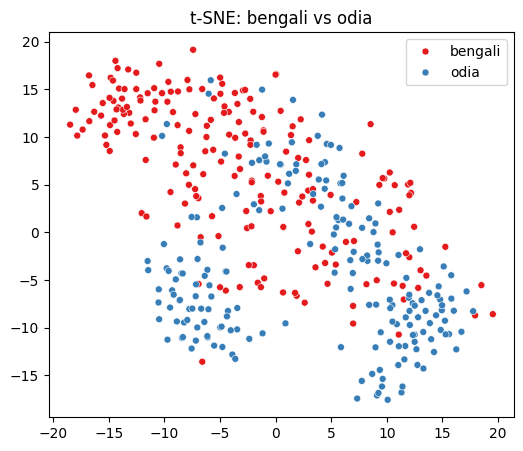

 13%|█▎        | 6/45 [00:19<02:06,  3.25s/it]

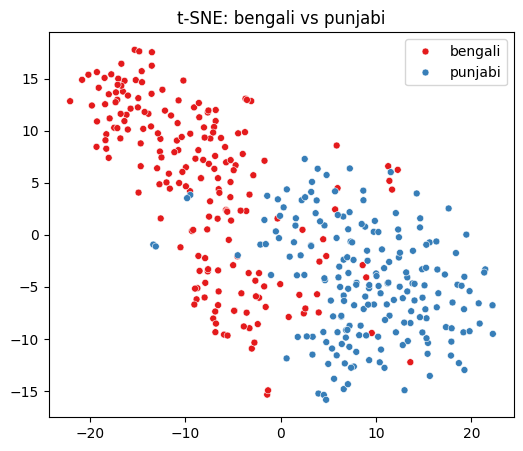

 16%|█▌        | 7/45 [00:22<02:00,  3.16s/it]

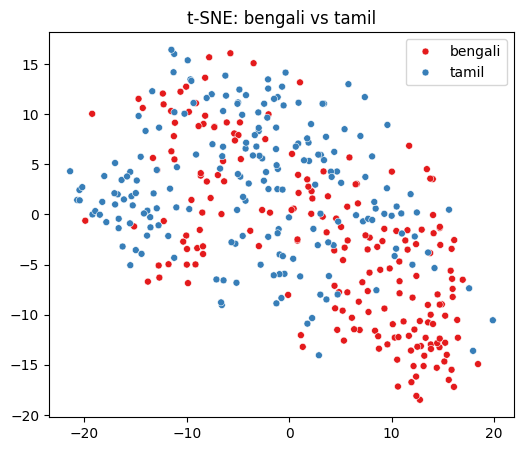

 18%|█▊        | 8/45 [00:26<02:06,  3.42s/it]

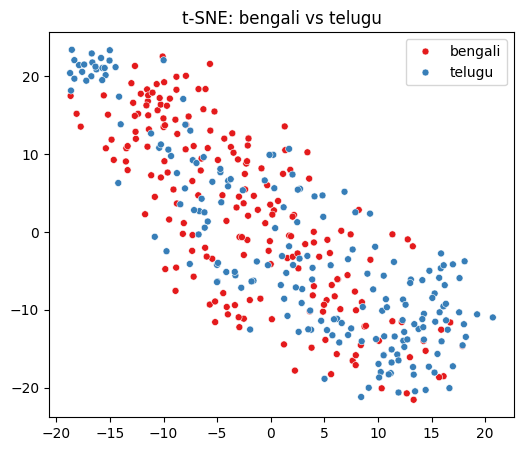

 20%|██        | 9/45 [00:30<02:06,  3.50s/it]

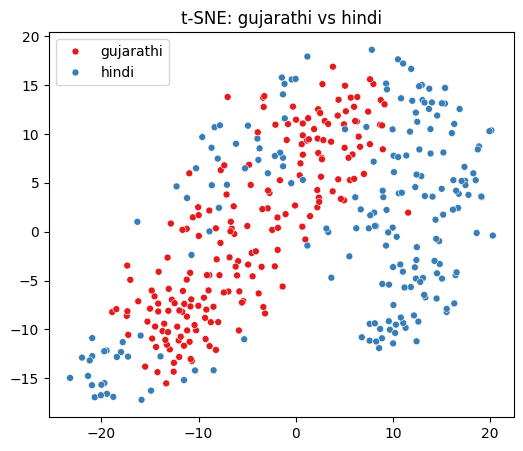

 22%|██▏       | 10/45 [00:33<01:56,  3.33s/it]

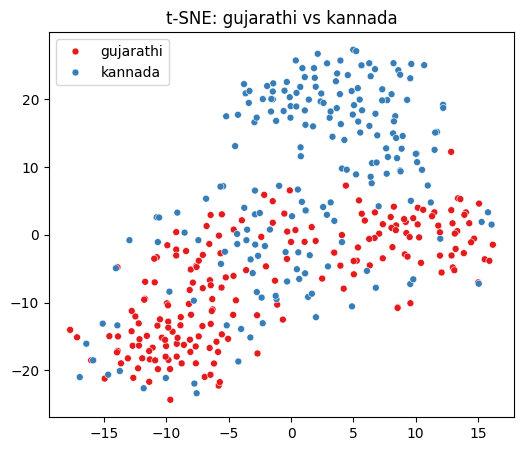

 24%|██▍       | 11/45 [00:36<01:51,  3.27s/it]

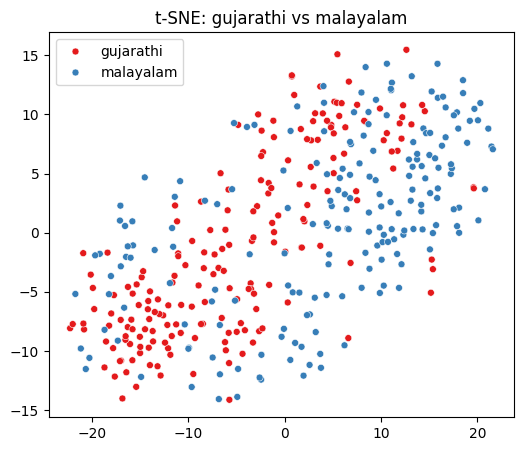

 27%|██▋       | 12/45 [00:39<01:52,  3.42s/it]

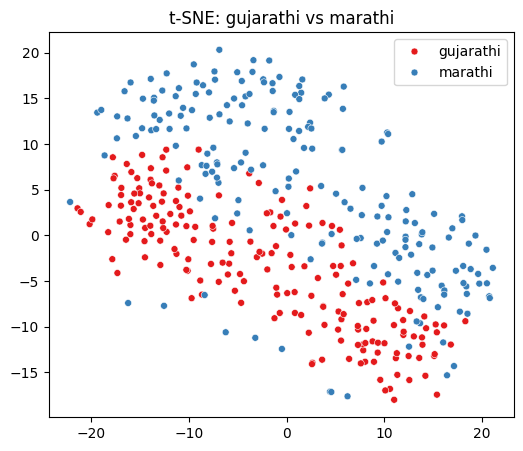

 29%|██▉       | 13/45 [00:44<01:56,  3.65s/it]

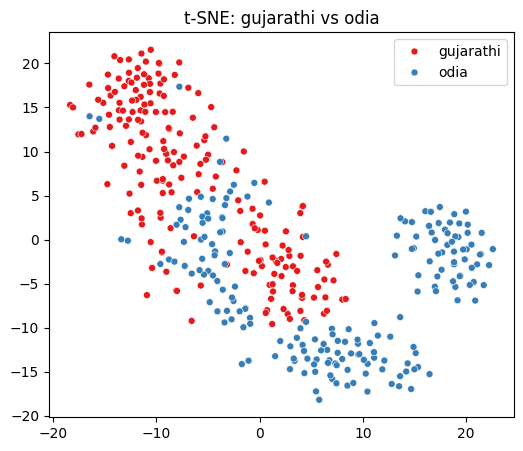

 31%|███       | 14/45 [00:46<01:45,  3.42s/it]

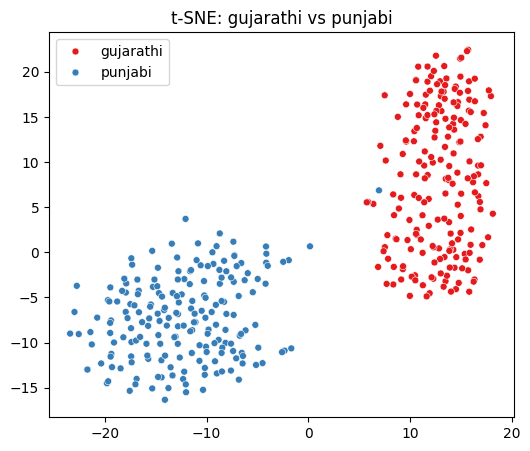

 33%|███▎      | 15/45 [00:49<01:36,  3.21s/it]

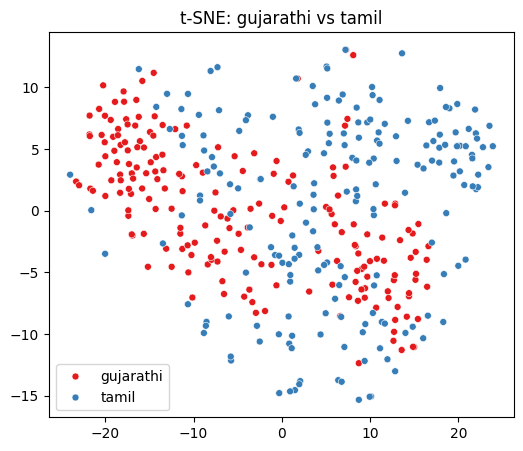

 36%|███▌      | 16/45 [00:53<01:40,  3.48s/it]

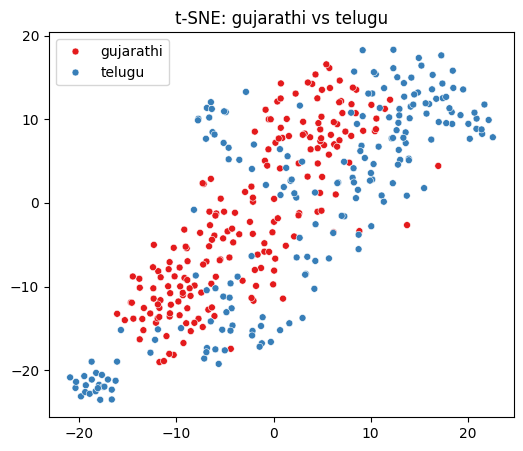

 38%|███▊      | 17/45 [00:57<01:41,  3.62s/it]

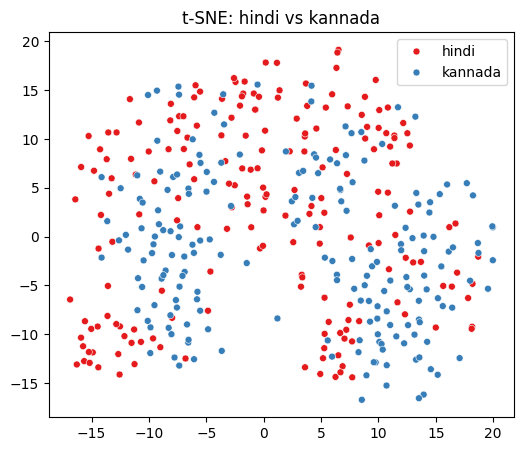

 40%|████      | 18/45 [01:00<01:32,  3.44s/it]

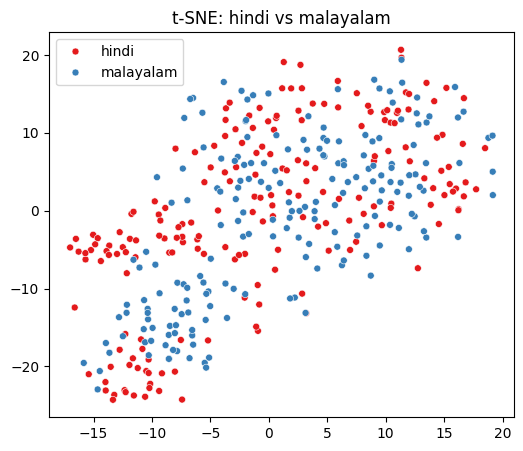

 42%|████▏     | 19/45 [01:03<01:26,  3.34s/it]

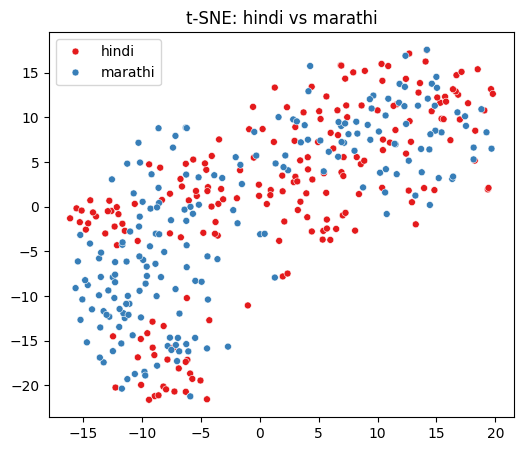

 44%|████▍     | 20/45 [01:07<01:22,  3.29s/it]

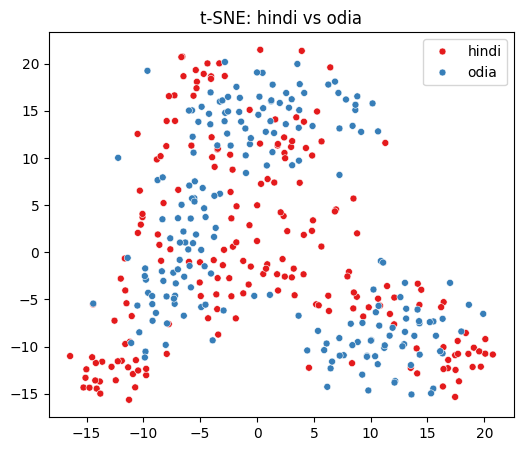

 47%|████▋     | 21/45 [01:11<01:29,  3.72s/it]

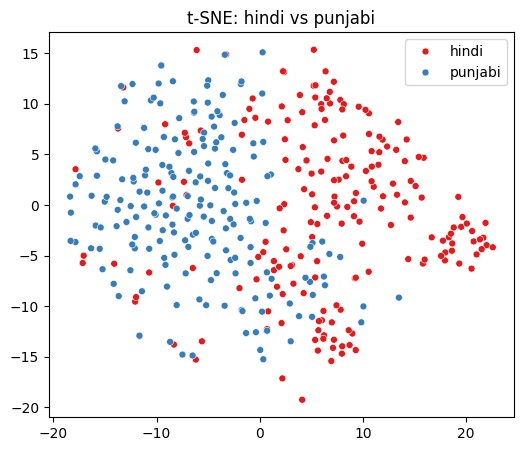

 49%|████▉     | 22/45 [01:14<01:21,  3.55s/it]

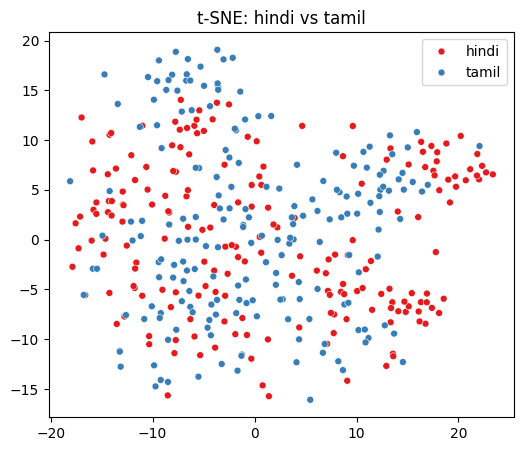

 51%|█████     | 23/45 [01:18<01:15,  3.41s/it]

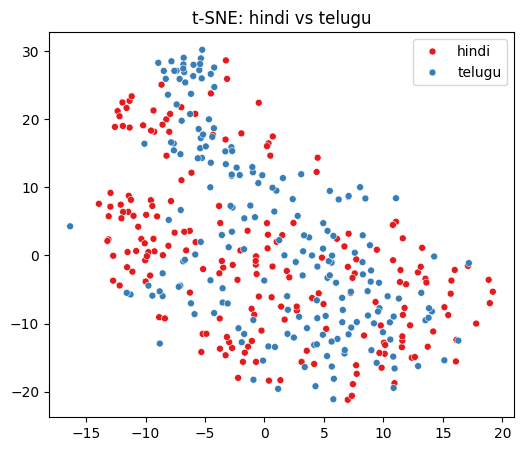

 53%|█████▎    | 24/45 [01:21<01:11,  3.40s/it]

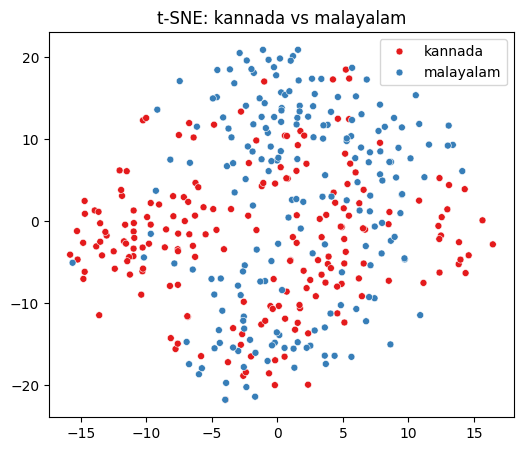

 56%|█████▌    | 25/45 [01:26<01:15,  3.79s/it]

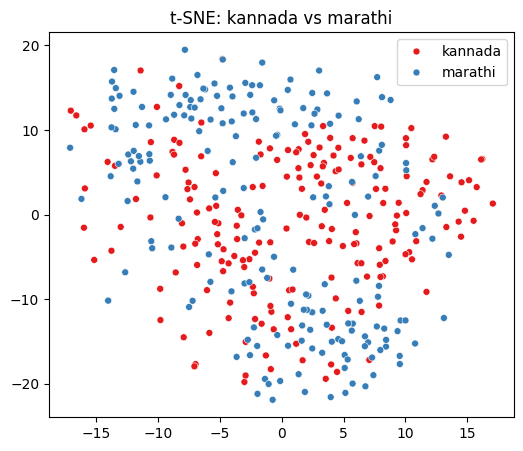

 58%|█████▊    | 26/45 [01:29<01:07,  3.57s/it]

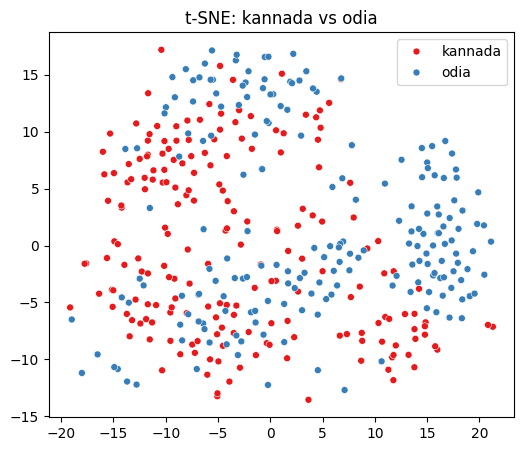

 60%|██████    | 27/45 [01:32<01:01,  3.41s/it]

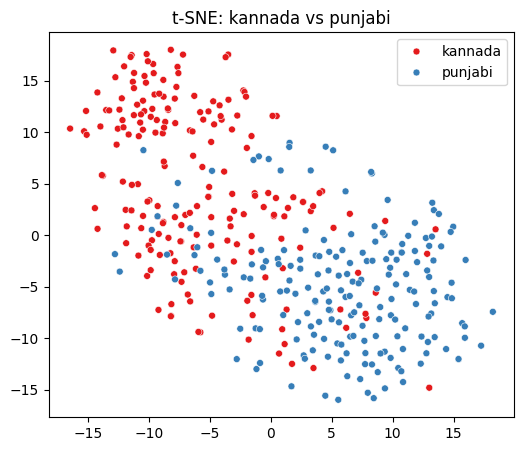

 62%|██████▏   | 28/45 [01:35<00:56,  3.34s/it]

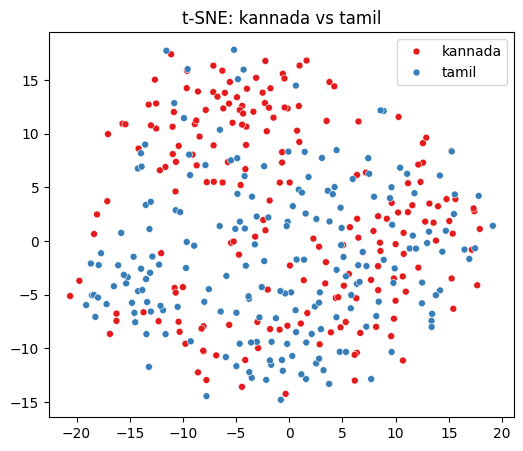

 64%|██████▍   | 29/45 [01:39<00:59,  3.71s/it]

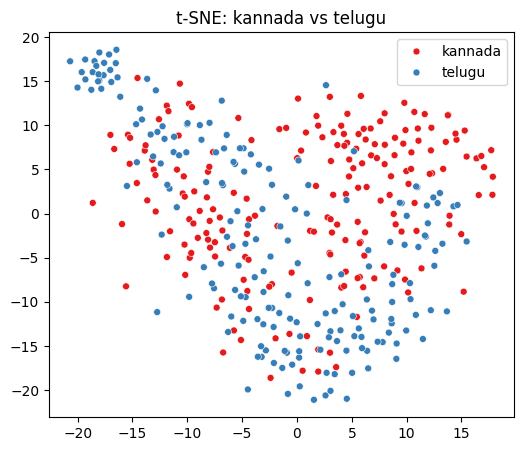

 67%|██████▋   | 30/45 [01:42<00:52,  3.51s/it]

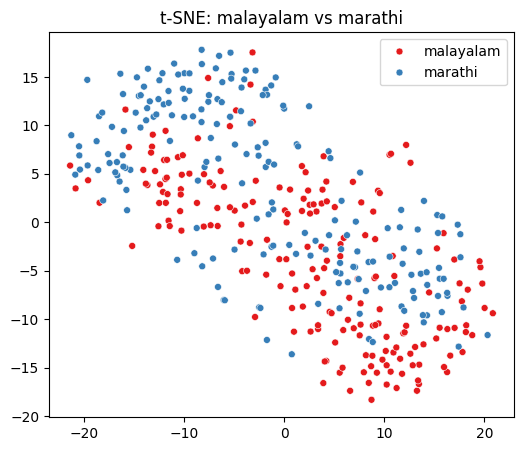

 69%|██████▉   | 31/45 [01:46<00:47,  3.39s/it]

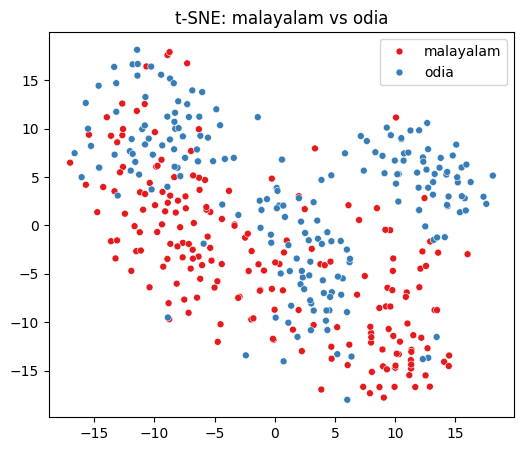

 71%|███████   | 32/45 [01:49<00:42,  3.27s/it]

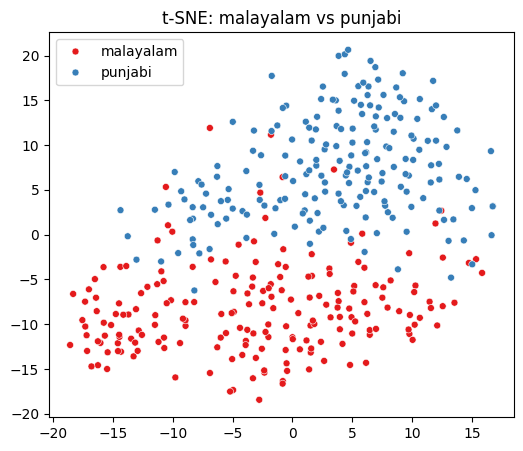

 73%|███████▎  | 33/45 [01:53<00:43,  3.66s/it]

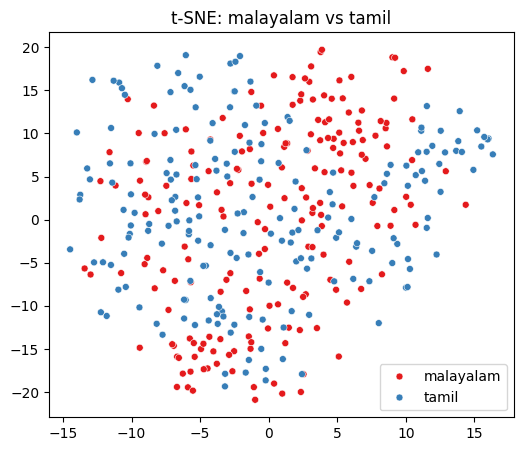

 76%|███████▌  | 34/45 [01:56<00:38,  3.52s/it]

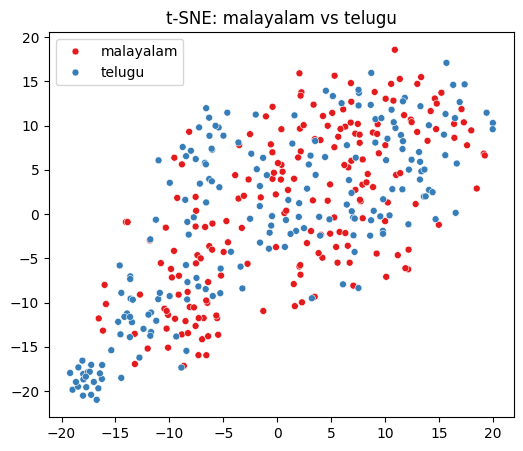

 78%|███████▊  | 35/45 [01:59<00:33,  3.37s/it]

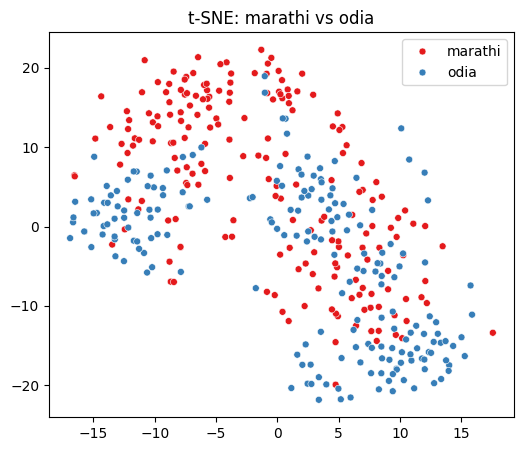

 80%|████████  | 36/45 [02:02<00:29,  3.30s/it]

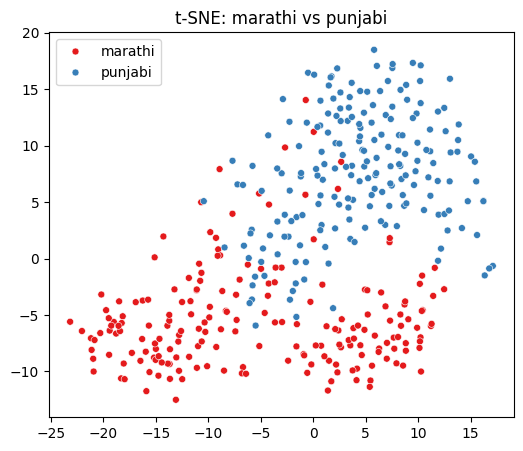

 82%|████████▏ | 37/45 [02:07<00:29,  3.67s/it]

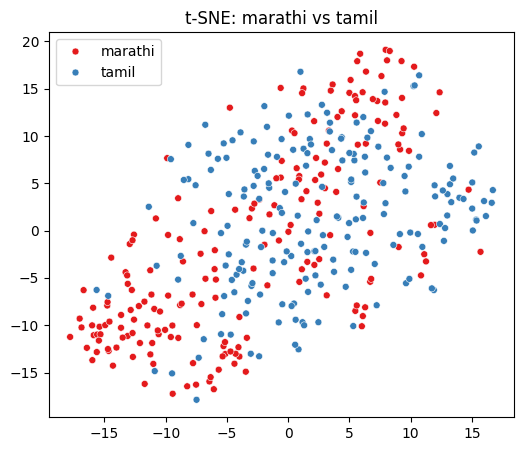

 84%|████████▍ | 38/45 [02:10<00:24,  3.48s/it]

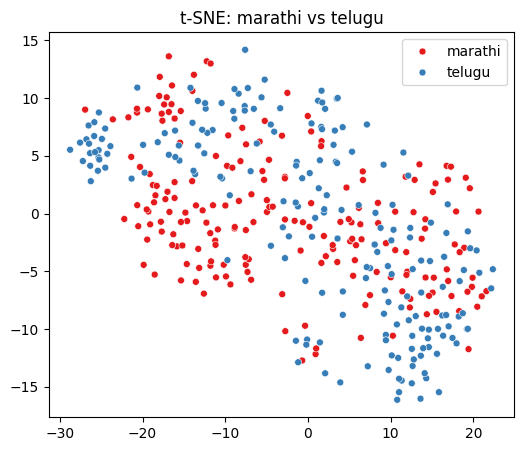

 87%|████████▋ | 39/45 [02:13<00:20,  3.40s/it]

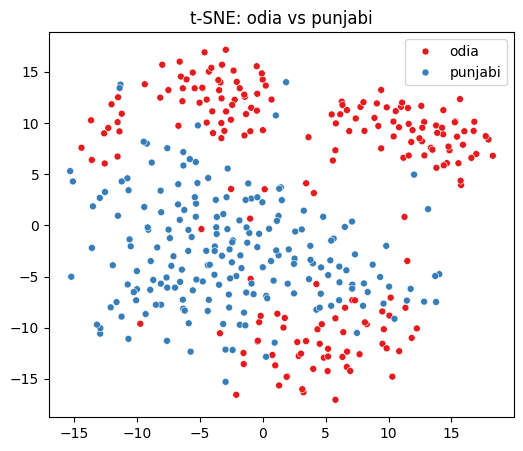

 89%|████████▉ | 40/45 [02:16<00:16,  3.26s/it]

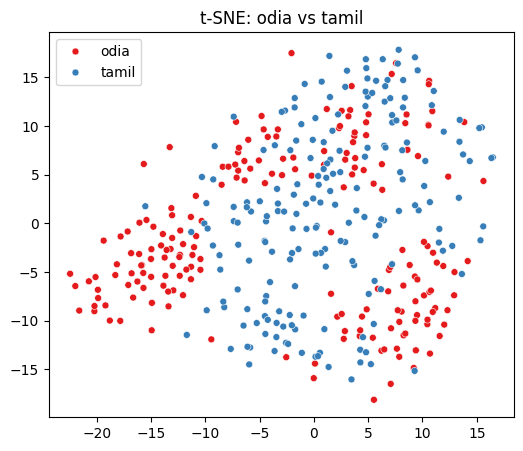

 91%|█████████ | 41/45 [02:20<00:14,  3.55s/it]

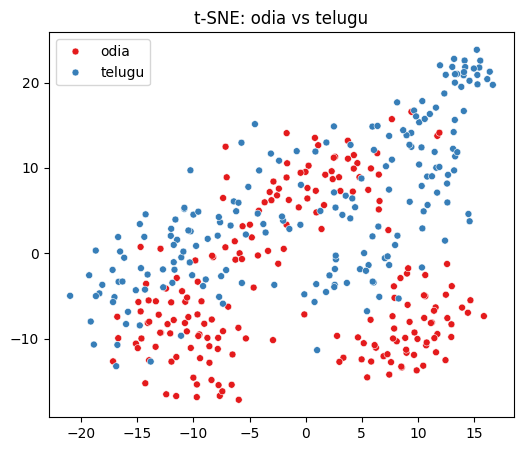

 93%|█████████▎| 42/45 [02:24<00:10,  3.47s/it]

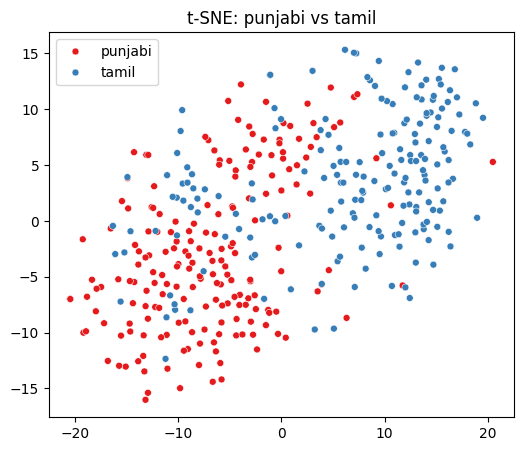

 96%|█████████▌| 43/45 [02:27<00:06,  3.37s/it]

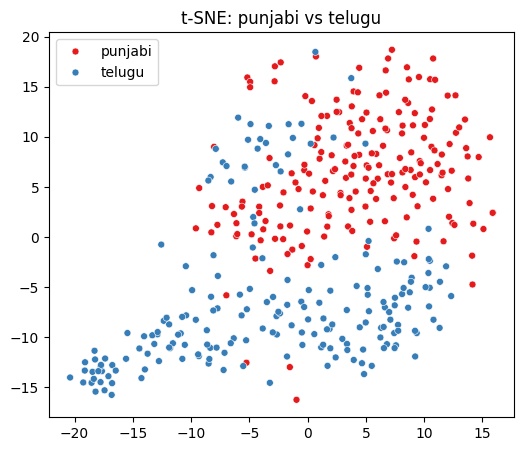

 98%|█████████▊| 44/45 [02:30<00:03,  3.24s/it]

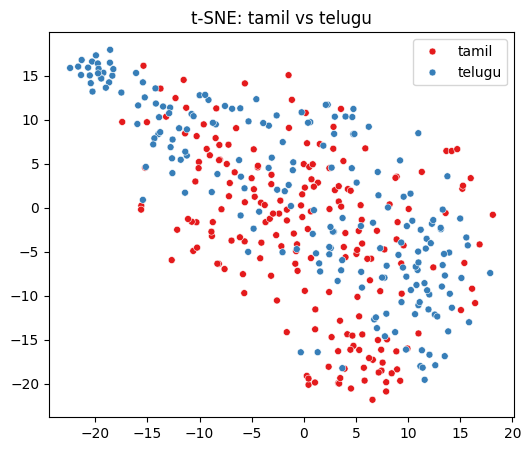

100%|██████████| 45/45 [02:34<00:00,  3.42s/it]


In [ ]:
langs = np.unique(language)
pairs = list(combinations(langs, 2))

for l1, l2 in tqdm(pairs):

    idx = np.where((language == l1) | (language == l2))[0]
    sub_s = s[idx]
    sub_lang = language[idx]

    pca = PCA(n_components=best_dim)
    reduced = pca.fit_transform(sub_s)

    tsne = TSNE(
        n_components=2,
        perplexity=30,
        learning_rate=200,
        init="pca",
        random_state=42
    )

    tsne_2d = tsne.fit_transform(reduced)

    plt.figure(figsize=(6,5))
    sns.scatterplot(
        x=tsne_2d[:,0],
        y=tsne_2d[:,1],
        hue=sub_lang,
        palette="Set1",
        s=25
    )
    plt.title(f"t-SNE: {l1} vs {l2}")
    plt.legend()
    plt.show()


In [ ]:
pair_scores = {}

for l1, l2 in pairs:
    idx = np.where((language == l1) | (language == l2))[0]
    sub_s = s[idx]
    sub_labels = LabelEncoder().fit_transform(language[idx])

    pca = PCA(n_components=best_dim)
    reduced = pca.fit_transform(sub_s)

    score = silhouette_score(reduced, sub_labels)
    pair_scores[(l1,l2)] = score

# Sort best separating accent pairs
sorted_pairs = sorted(pair_scores.items(), key=lambda x: x[1], reverse=True)

print("Top 5 best separated accent pairs:")
for pair, score in sorted_pairs[:5]:
    print(pair, "→", score)


Top 5 best separated accent pairs:
(np.str_('gujarathi'), np.str_('punjabi')) → 0.16942853
(np.str_('bengali'), np.str_('punjabi')) → 0.1019273
(np.str_('gujarathi'), np.str_('odia')) → 0.094411
(np.str_('marathi'), np.str_('punjabi')) → 0.082889006
(np.str_('punjabi'), np.str_('telugu')) → 0.075359665


some deeper analysis

In [ ]:
X = s

In [ ]:
from sklearn.metrics import pairwise_distances

langs = np.unique(language)
dist_matrix = pairwise_distances(X, metric='cosine')

intra = {}
inter = {}

for lang in langs:
    idx = np.where(language == lang)[0]
    other = np.where(language != lang)[0]

    intra_d = dist_matrix[np.ix_(idx, idx)]
    inter_d = dist_matrix[np.ix_(idx, other)]

    intra_mean = intra_d[np.triu_indices_from(intra_d, k=1)].mean()
    inter_mean = inter_d.mean()

    intra[lang] = intra_mean
    inter[lang] = inter_mean

for lang in langs:
    print(f"{lang:12s} | intra: {intra[lang]:.4f} | inter: {inter[lang]:.4f}")


bengali      | intra: 0.1824 | inter: 0.1913
gujarathi    | intra: 0.1399 | inter: 0.1817
hindi        | intra: 0.1954 | inter: 0.1913
kannada      | intra: 0.1662 | inter: 0.1795
malayalam    | intra: 0.1702 | inter: 0.1824
marathi      | intra: 0.1905 | inter: 0.1922
odia         | intra: 0.1758 | inter: 0.1903
punjabi      | intra: 0.1623 | inter: 0.1989
tamil        | intra: 0.1641 | inter: 0.1780
telugu       | intra: 0.1911 | inter: 0.1905


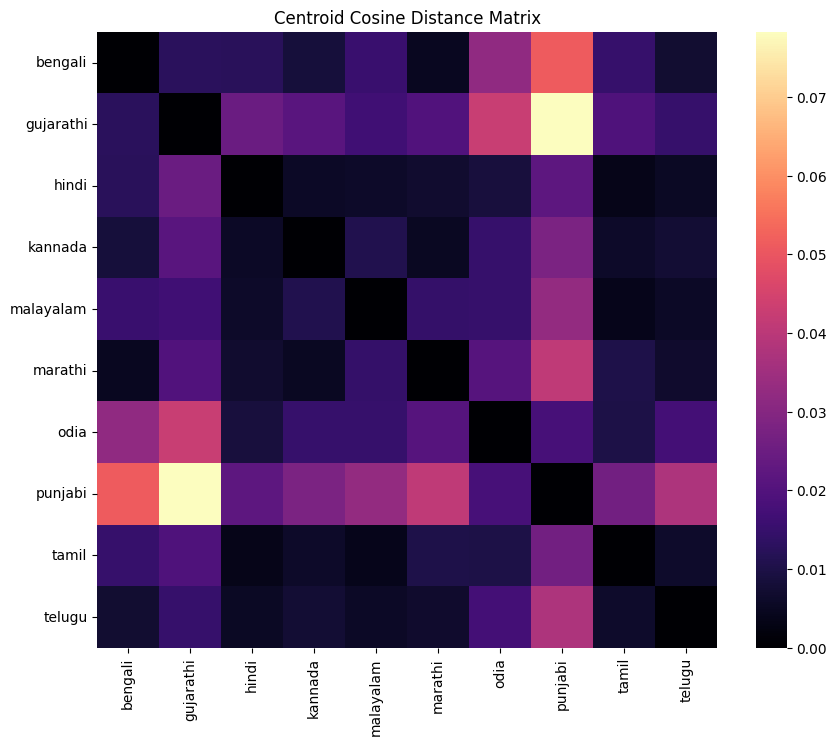

In [ ]:
centroids = {}

for lang in langs:
    idx = np.where(language == lang)[0]
    centroids[lang] = X[idx].mean(axis=0)

centroid_matrix = pairwise_distances(
    np.vstack([centroids[l] for l in langs]),
    metric='cosine'
)

plt.figure(figsize=(10,8))
sns.heatmap(centroid_matrix,
            xticklabels=langs,
            yticklabels=langs,
            cmap='magma')
plt.title("Centroid Cosine Distance Matrix")
plt.show()


In [ ]:
for lang in langs:
    idx = np.where(language == lang)[0]
    var = np.var(X[idx], axis=0).mean()
    print(f"{lang:12s} | variance: {var:.6f}")


bengali      | variance: 0.000709
gujarathi    | variance: 0.000544
hindi        | variance: 0.000760
kannada      | variance: 0.000646
malayalam    | variance: 0.000661
marathi      | variance: 0.000740
odia         | variance: 0.000683
punjabi      | variance: 0.000631
tamil        | variance: 0.000638
telugu       | variance: 0.000743


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

def separability(lang1, lang2):
    idx = np.where((language == lang1) | (language == lang2))[0]
    X_sub = X[idx]
    y_sub = (language[idx] == lang1).astype(int)

    clf = LogisticRegression(max_iter=2000)
    scores = cross_val_score(clf, X_sub, y_sub, cv=5)

    return scores.mean()

print("Gujarati vs Punjabi accuracy:", separability('gujarathi', 'punjabi'))
print("Gujarati vs Telugu accuracy:", separability('gujarathi', 'telugu'))
print("Punjabi vs Telugu accuracy:", separability('punjabi', 'telugu'))

print("Tamil vs Telugu accuracy:", separability('tamil', 'telugu'))


Gujarati vs Punjabi accuracy: 0.9871794871794872
Gujarati vs Telugu accuracy: 0.841025641025641
Punjabi vs Telugu accuracy: 0.8948717948717949
Tamil vs Telugu accuracy: 0.6948717948717948


In [ ]:
filename = data["filename"].squeeze()
filename = np.array([str(x[0]) if isinstance(x, np.ndarray) else str(x)
                     for x in filename])
filename = filename[mask]

unique_sentences = np.unique(filename)

from sklearn.metrics import pairwise_distances

accent_spread = []

for s_id in unique_sentences:
    idx = np.where(filename == s_id)[0]
    subset = X[idx]  # 10 accents

    d = pairwise_distances(subset, metric='cosine')
    accent_spread.append(d[np.triu_indices_from(d, k=1)].mean())

print("Mean accent spread per sentence:", np.mean(accent_spread))


Mean accent spread per sentence: 0.1711556


In [ ]:
for d in dims:
    pca = PCA(n_components=d)
    reduced = pca.fit_transform(X)

    score = silhouette_score(reduced, labels, metric='cosine')
    print(f"PCA {d}D (cosine) → Silhouette: {score:.4f}")


PCA 10D (cosine) → Silhouette: -0.1009
PCA 20D (cosine) → Silhouette: -0.0750
PCA 50D (cosine) → Silhouette: -0.0522
PCA 70D (cosine) → Silhouette: -0.0478
PCA 100D (cosine) → Silhouette: -0.0465


Even deeper analysis

In [ ]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_distances
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

import umap


In [ ]:
# Assume original s, language already loaded and cleaned

# Reconstruct sentence ids
# Each language has identical 195 sentences in same order

num_languages = 10
num_sentences = 195

# Create sentence index per sample
sentence_ids = np.tile(np.arange(num_sentences), num_languages)

# Sort data by sentence to guarantee alignment
sort_idx = np.lexsort((language, sentence_ids))
s_sorted = s[sort_idx]
language_sorted = language[sort_idx]
sentence_ids_sorted = sentence_ids[sort_idx]

# Sentence-centering
s_centered = np.zeros_like(s_sorted)

for sid in range(num_sentences):
    mask = sentence_ids_sorted == sid
    mean_vec = s_sorted[mask].mean(axis=0)
    s_centered[mask] = s_sorted[mask] - mean_vec

# Re-normalize
norms = np.linalg.norm(s_centered, axis=1, keepdims=True)
s_centered = s_centered / (norms + 1e-8)

print("Centered embeddings ready:", s_centered.shape)


Centered embeddings ready: (1950, 256)


In [ ]:
print("sa stats:")
print("min:", np.min(sa))
print("max:", np.max(sa))
print("mean abs:", np.mean(np.abs(sa)))

print("\nsp stats:")
print("min:", np.min(sp))
print("max:", np.max(sp))
print("mean abs:", np.mean(np.abs(sp)))

print("\nAny NaNs in sa?", np.isnan(sa).any())
print("Any NaNs in sp?", np.isnan(sp).any())
print("Any infs in sa?", np.isinf(sa).any())
print("Any infs in sp?", np.isinf(sp).any())


sa stats:
min: 0.0
max: 0.0
mean abs: 0.0

sp stats:
min: -0.2686535
max: 0.27390543
mean abs: 0.07167618

Any NaNs in sa? False
Any NaNs in sp? False
Any infs in sa? False
Any infs in sp? False


In [ ]:
# Remove non-finite rows
mask_sa = np.isfinite(sa).all(axis=1)
mask_sp = np.isfinite(sp).all(axis=1)

sa = sa[mask_sa]
sp = sp[mask_sp]
lang_sa = lang_sa[mask_sa]

# Clip extreme values
sa = np.clip(sa, -50, 50)
sp = np.clip(sp, -50, 50)

# L2 normalize safely
sa = sa / (np.linalg.norm(sa, axis=1, keepdims=True) + 1e-8)
sp = sp / (np.linalg.norm(sp, axis=1, keepdims=True) + 1e-8)


In [ ]:
sa = data["sa"]
sp = data["sp"]

# Clean
mask = np.isfinite(sa).all(axis=1)
sa = sa[mask]
sp = sp[mask]
lang_sa = language[mask]

# Normalize
sa = sa / (np.linalg.norm(sa, axis=1, keepdims=True) + 1e-8)
sp = sp / (np.linalg.norm(sp, axis=1, keepdims=True) + 1e-8)

le = LabelEncoder()
labels = le.fit_transform(lang_sa)

for name, emb in [("sa", sa), ("sp", sp)]:
    pca = PCA(n_components=50)
    reduced = pca.fit_transform(emb)
    score = silhouette_score(reduced, labels, metric="cosine")
    print(f"{name} → silhouette (50D PCA, cosine): {score:.4f}")


/usr/local/lib/python3.12/dist-packages/numpy/linalg/_linalg.py:2772: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real
/usr/local/lib/python3.12/dist-packages/numpy/linalg/_linalg.py:2773: RuntimeWarning: overflow encountered in reduce
  return sqrt(add.reduce(s, axis=axis, keepdims=keepdims))
/usr/local/lib/python3.12/dist-packages/sklearn/decomposition/_pca.py:648: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


sa → silhouette (50D PCA, cosine): 0.0000
sp → silhouette (50D PCA, cosine): -0.0941


In [ ]:
le = LabelEncoder()
labels_centered = le.fit_transform(language_sorted)

dims = [10, 20, 50, 100]

for d in dims:
    pca = PCA(n_components=d)
    reduced = pca.fit_transform(s_centered)
    score = silhouette_score(reduced, labels_centered, metric="cosine")
    print(f"Centered PCA {d}D → Silhouette: {score:.4f}")


Centered PCA 10D → Silhouette: -0.0860
Centered PCA 20D → Silhouette: -0.0553
Centered PCA 50D → Silhouette: -0.0335
Centered PCA 100D → Silhouette: -0.0276


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


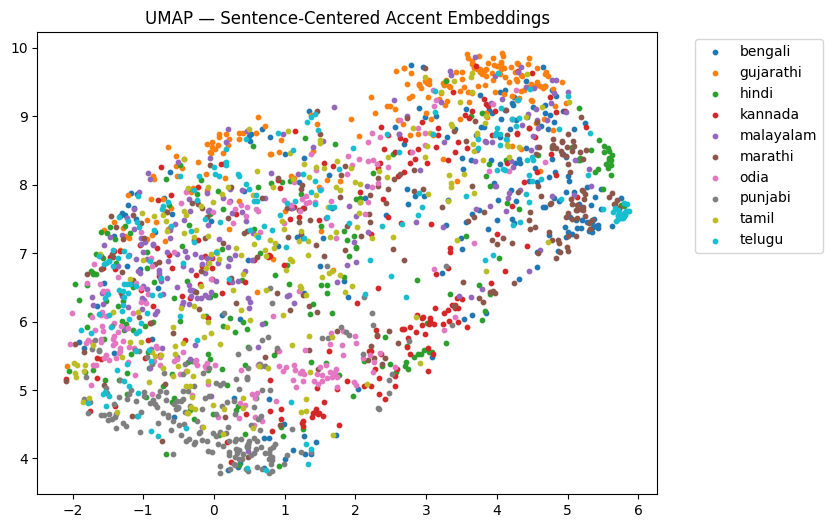

In [ ]:
reducer = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    metric="cosine",
    random_state=42
)

embedding_2d = reducer.fit_transform(s_centered)

plt.figure(figsize=(8,6))

for lang in np.unique(language_sorted):
    mask = language_sorted == lang
    plt.scatter(
        embedding_2d[mask, 0],
        embedding_2d[mask, 1],
        label=lang,
        s=10
    )

plt.title("UMAP — Sentence-Centered Accent Embeddings")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()


In [ ]:
X = s_centered
y = labels_centered

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

accs = []

for train_idx, test_idx in skf.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    clf = LogisticRegression(max_iter=5000)
    clf.fit(X_train, y_train)

    acc = clf.score(X_test, y_test)
    accs.append(acc)

print("10-class accuracy:", np.mean(accs))


NameError: name 'labels_centered' is not defined

In [ ]:
spread = {}

for lang in np.unique(language_sorted):
    mask = language_sorted == lang
    spread[lang] = np.mean(np.linalg.norm(s_centered[mask], axis=1))

print("Accent deformation magnitude:")
for k,v in spread.items():
    print(k, "→", round(v, 4))


f0, pitch, stress, rhythm (?), some even more deeper work (dont know if it makes any sense)

Embedding shape: (1950, 256)
Languages: ['bengali' 'gujarathi' 'hindi' 'kannada' 'malayalam' 'marathi' 'odia'
 'punjabi' 'tamil' 'telugu']
Total samples: 1950

Accent vector magnitudes:
bengali      → 0.1139
gujarathi    → 0.1717
hindi        → 0.0512
kannada      → 0.0691
malayalam    → 0.0823
marathi      → 0.0905
odia         → 0.1283
punjabi      → 0.2066
tamil        → 0.0603
telugu       → 0.0689


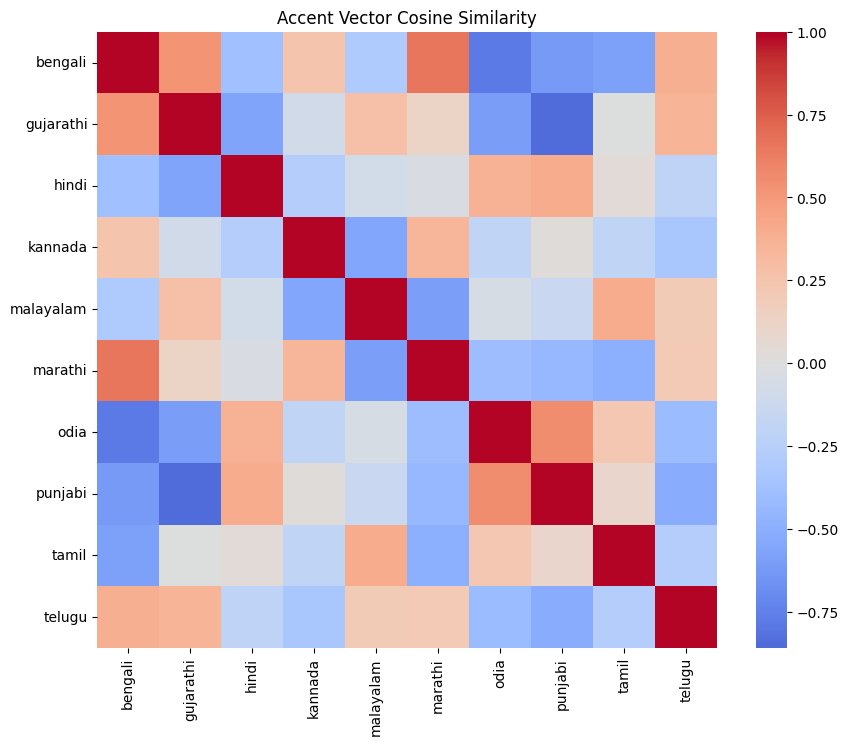


Mean accent spread per sentence: 0.00060171896


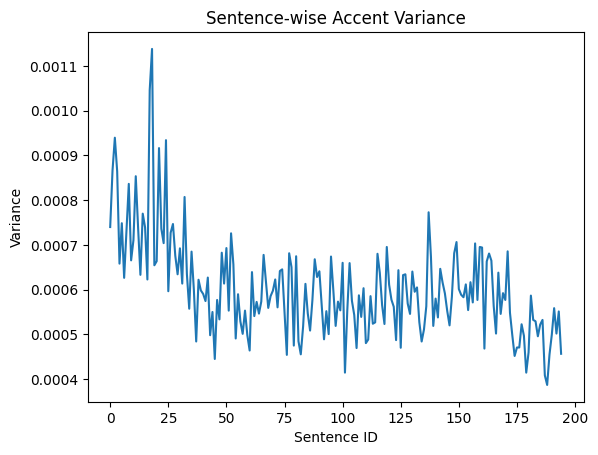


Linear probe accuracy (5-fold): 0.36615384615384616
PCA 10D → Silhouette (cosine): -0.1009
PCA 20D → Silhouette (cosine): -0.0750
PCA 50D → Silhouette (cosine): -0.0522
PCA 100D → Silhouette (cosine): -0.0465

Top Pairwise Accent Separations:
((np.str_('gujarathi'), np.str_('punjabi')), np.float64(0.9871794871794872))
((np.str_('malayalam'), np.str_('punjabi')), np.float64(0.9230769230769231))
((np.str_('gujarathi'), np.str_('marathi')), np.float64(0.8948717948717949))
((np.str_('punjabi'), np.str_('telugu')), np.float64(0.8948717948717949))
((np.str_('marathi'), np.str_('punjabi')), np.float64(0.8923076923076924))


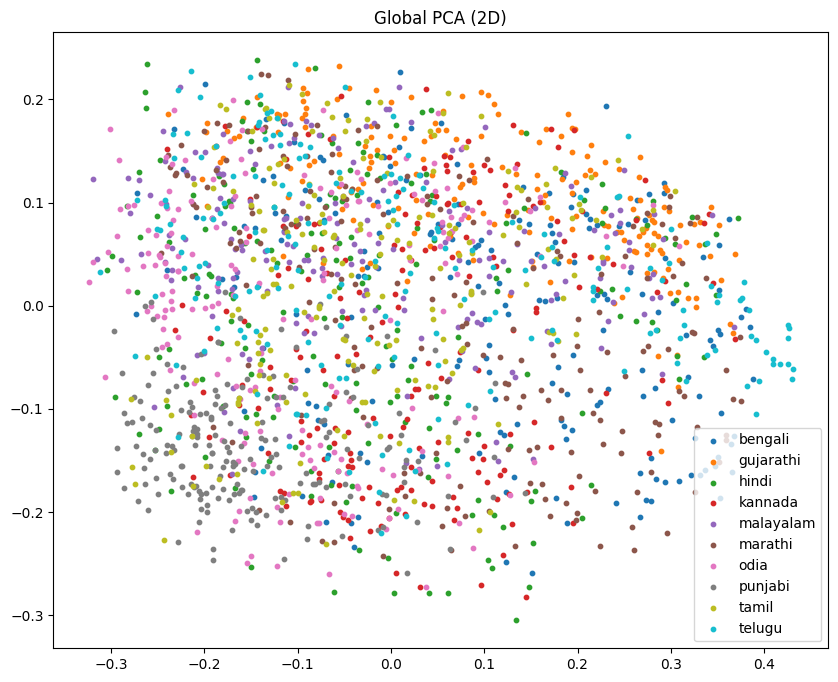

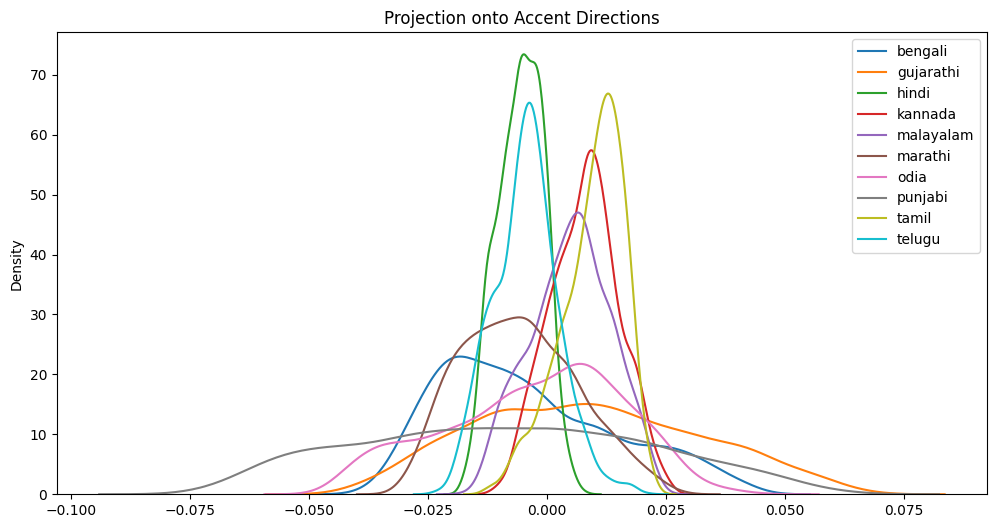


Analysis Complete.


In [ ]:
# ================================================================
# Deep Accent Geometry Analysis (Embeddings Only)
# ================================================================

import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations

# ------------------------------------------------
# Load MAT file
# ------------------------------------------------

MAT_PATH = "/content/drive/MyDrive/Namrata-IMP-Docs/IIITH/Research/indic_style_full_ft.mat"

data = sio.loadmat(MAT_PATH)

X = data["s"]   # (1950, 256)
language = data["language"].squeeze()

language = np.array([
    str(x[0]) if isinstance(x, np.ndarray) else str(x)
    for x in language
])

print("Embedding shape:", X.shape)
print("Languages:", np.unique(language))


# ------------------------------------------------
# Cleaning
# ------------------------------------------------

mask = np.isfinite(X).all(axis=1)
X = X[mask]
language = language[mask]

X = np.clip(X, -10, 10)

# L2 normalize
norms = np.linalg.norm(X, axis=1, keepdims=True)
X = X / (norms + 1e-8)


# ------------------------------------------------
# Encode labels
# ------------------------------------------------

le = LabelEncoder()
y = le.fit_transform(language)
langs = le.classes_

print("Total samples:", len(y))


# ================================================================
# A) Accent Centroid Vectors
# ================================================================

global_mean = X.mean(axis=0)

accent_vectors = {}
accent_norms = {}

for lang in langs:
    idx = language == lang
    centroid = X[idx].mean(axis=0)
    accent_vec = centroid - global_mean
    accent_vectors[lang] = accent_vec
    accent_norms[lang] = np.linalg.norm(accent_vec)

print("\nAccent vector magnitudes:")
for k, v in accent_norms.items():
    print(f"{k:12s} → {v:.4f}")


# ================================================================
# B) Accent Vector Similarity Matrix
# ================================================================

A = np.vstack([accent_vectors[l] for l in langs])
sim_matrix = cosine_similarity(A)

plt.figure(figsize=(10,8))
sns.heatmap(sim_matrix, xticklabels=langs, yticklabels=langs,
            cmap="coolwarm", center=0)
plt.title("Accent Vector Cosine Similarity")
plt.show()


# ================================================================
# C) Sentence-conditioned Accent Variance
# ================================================================

# since dataset is structured with identical sentences across languages:
# reshape into (num_sentences, num_languages, dim)

num_languages = len(langs)
num_sentences = X.shape[0] // num_languages

X_reshaped = X.reshape(num_languages, num_sentences, -1)
X_reshaped = np.transpose(X_reshaped, (1, 0, 2))  # (sent, lang, dim)

sentence_variance = []

for i in range(num_sentences):
    sentence_embeddings = X_reshaped[i]
    var = np.mean(np.var(sentence_embeddings, axis=0))
    sentence_variance.append(var)

print("\nMean accent spread per sentence:", np.mean(sentence_variance))

plt.plot(sentence_variance)
plt.title("Sentence-wise Accent Variance")
plt.xlabel("Sentence ID")
plt.ylabel("Variance")
plt.show()


# ================================================================
# D) Linear Probe Classification (Accent Strength)
# ================================================================

clf = LogisticRegression(max_iter=5000)

scores = cross_val_score(clf, X, y, cv=5)
print("\nLinear probe accuracy (5-fold):", scores.mean())


# ================================================================
# E) PCA Silhouette (Cosine)
# ================================================================

dims = [10, 20, 50, 100]

for d in dims:
    pca = PCA(n_components=d)
    reduced = pca.fit_transform(X)
    sil = silhouette_score(reduced, y, metric="cosine")
    print(f"PCA {d}D → Silhouette (cosine): {sil:.4f}")


# ================================================================
# F) Pairwise Language Separability
# ================================================================

print("\nTop Pairwise Accent Separations:")

pair_scores = []

for l1, l2 in combinations(langs, 2):
    idx = np.logical_or(language == l1, language == l2)
    X_pair = X[idx]
    y_pair = (language[idx] == l1).astype(int)

    clf = LogisticRegression(max_iter=5000)
    score = cross_val_score(clf, X_pair, y_pair, cv=5).mean()

    pair_scores.append(((l1, l2), score))

pair_scores = sorted(pair_scores, key=lambda x: x[1], reverse=True)

for p in pair_scores[:5]:
    print(p)


# ================================================================
# G) Global PCA Visualization
# ================================================================

pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X)

plt.figure(figsize=(10,8))
for lang in langs:
    idx = language == lang
    plt.scatter(X_pca2[idx,0], X_pca2[idx,1], label=lang, s=10)

plt.legend()
plt.title("Global PCA (2D)")
plt.show()


# ================================================================
# H) Accent Direction Projection
# ================================================================

# Project embeddings onto accent vector axis
plt.figure(figsize=(12,6))

for lang in langs:
    projections = X @ accent_vectors[lang]
    sns.kdeplot(projections, label=lang)

plt.title("Projection onto Accent Directions")
plt.legend()
plt.show()

print("\nAnalysis Complete.")
